# Self-Driving Car Engineer Nanodegree

## Project: Build a Traffic Sign Recognition Classifier

---
## Overview
The goal of this project is to build a convolution neural network in Keras that clones a driver's behavior and predicts steering angles from images. The model I built could successfully drive around track one without leaving the road. The following animation shows how the car drives on the lake side track.

[Animation Place holder]()

My project includes the following files:

`model.py` containing the script to create and train the model  
`utils.py` containing all the utilities functions  
`drive.py` for driving the car in autonomous mode  
`model.h5` containing a trained convolution neural network  
`README.md` summarizing the results  


In [115]:
"""
Finding the correction matrix and distortion coefficients
"""

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = np.mgrid[0:8, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
image_names = glob.glob('camera_cal/calibration*.jpg')
image_names.sort()

# Step through the list and search for chessboard corners
for idx, fname in enumerate(image_names):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_size = (img.shape[1], img.shape[0])
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (8,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        cv2.drawChessboardCorners(img, (8,6), corners, ret)

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

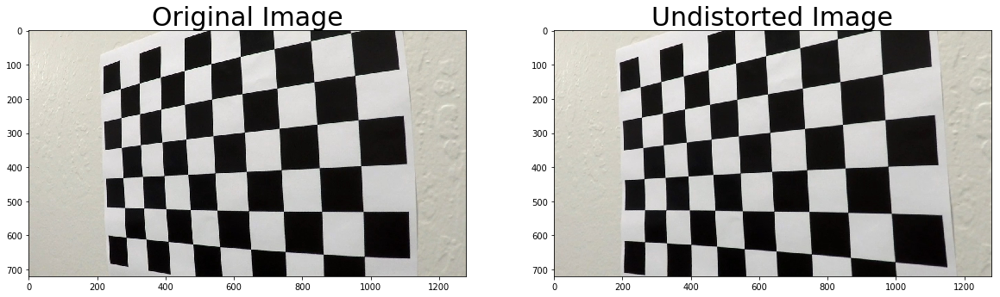

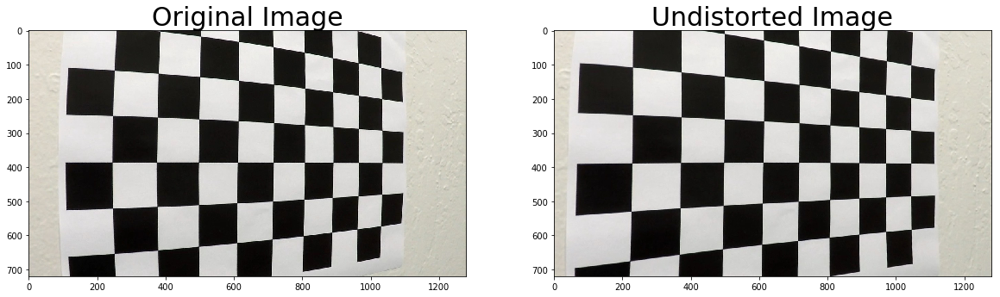

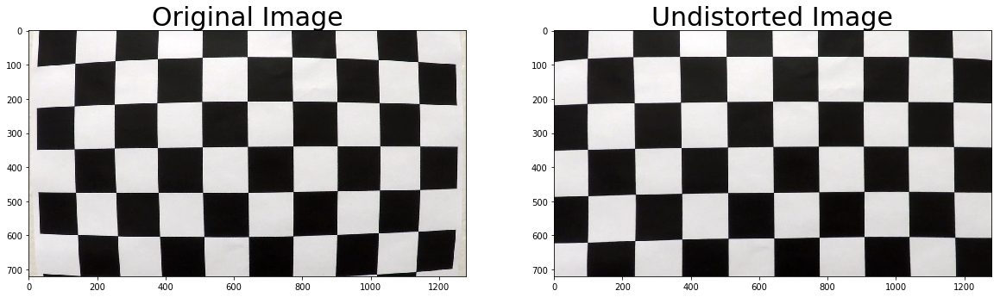

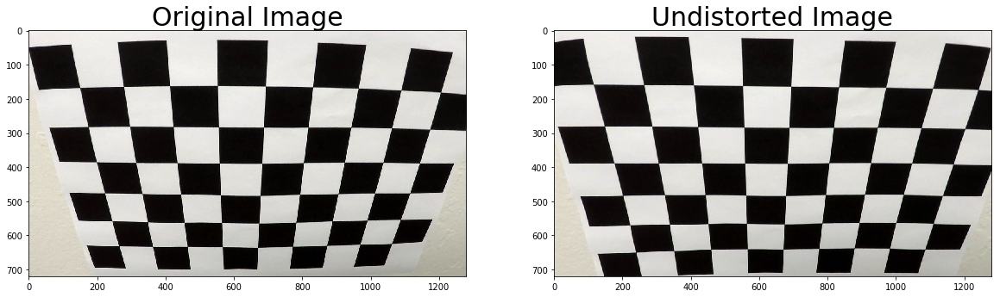

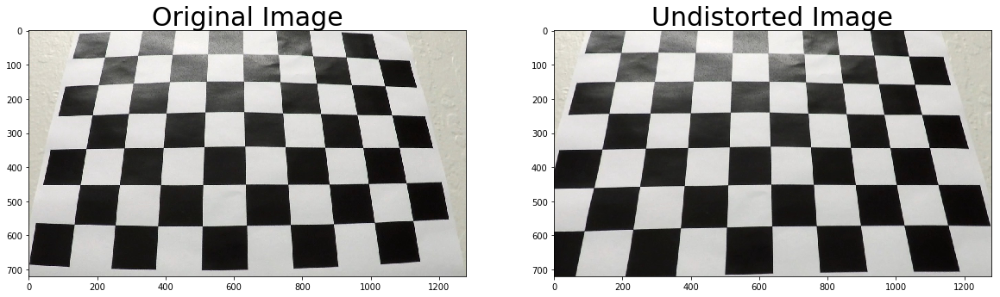

In [116]:
"""
Undistort the images
"""

import pickle
import os
%matplotlib inline

def undistort(mtx, dist, img_in_path, img_out_path='', plot=False):
    # Test undistortion on an image
    img = cv2.imread(img_in_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_size = (img.shape[1], img.shape[0])
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    if img_out_path:
        cv2.imwrite(img_out_path,dst)
    
    if plot:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(dst)
        ax2.set_title('Undistorted Image', fontsize=30)
    return dst

image_in_folder = 'camera_cal/'
image_out_folder = 'camera_cal_output/'
files = [x for x in os.listdir(image_in_folder) if x.endswith('.jpg')]
chessboard_undists = []
for file in files:
    chessboard_undists.append(undistort(mtx,dist,
                              os.path.join(image_in_folder,file),
                              os.path.join(image_out_folder,file),
                              plot=True))

In [117]:
# X,Y
img_size = (1280, 720)
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
            
# MMa 2017-06-27 Why it failed immediately when top source points are less then half of the height ??!
src = np.float32([ [img_size[0]/2-116,img_size[1]/2+150],
                    [img_size[0]/2+116,img_size[1]/2+150],
                    [img_size[0]/2+320,img_size[1]],
                    [img_size[0]/2-320,img_size[1]]])

offset_x = 300 # offset for dst points
offset_y = 400
dst = np.float32([ [offset_x, offset_y], 
                    [img_size[0]-offset_x, offset_y], 
                    [img_size[0]-offset_x, img_size[1]], 
                    [offset_x, img_size[1]]])

M = cv2.getPerspectiveTransform(src, dst)
M_inv = cv2.getPerspectiveTransform(dst, src)
ploty = np.linspace(0, img_size[1]-1, img_size[1]/10 )

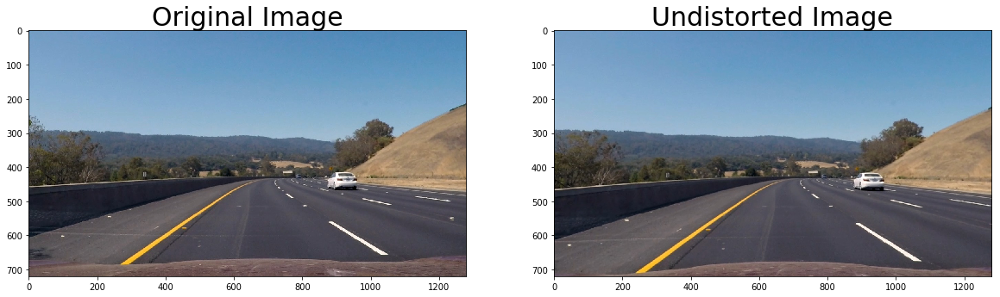

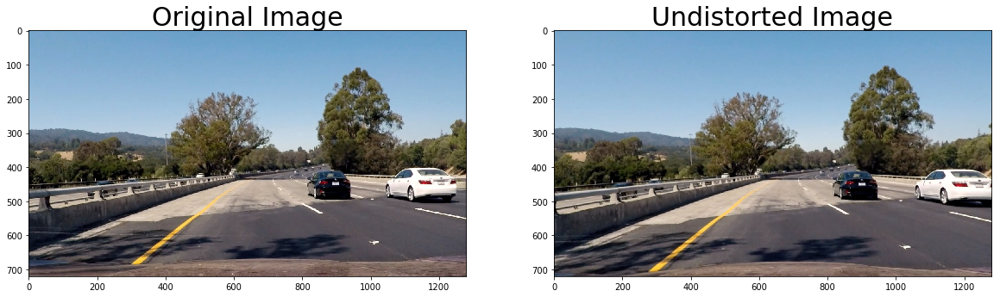

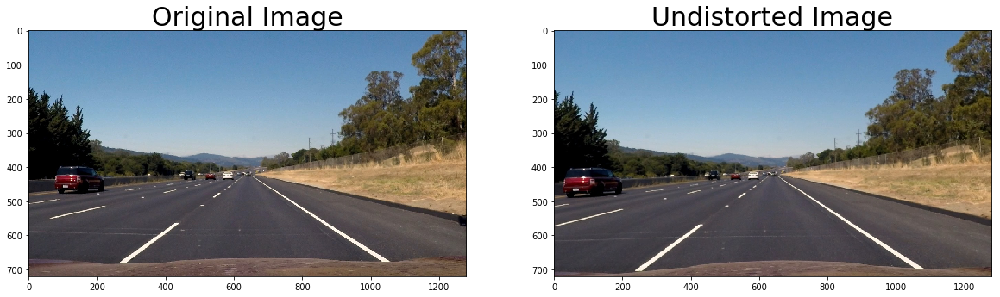

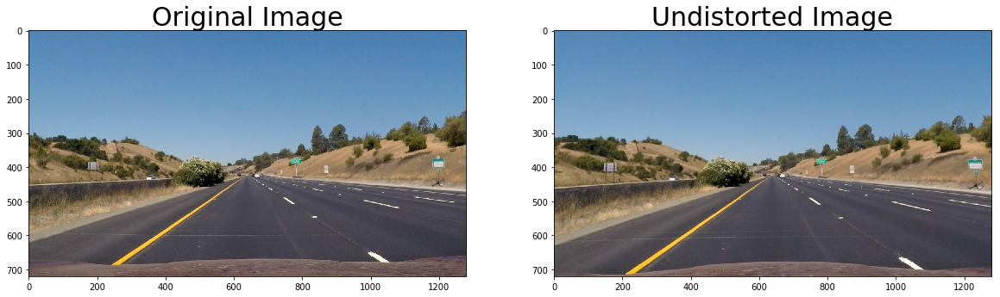

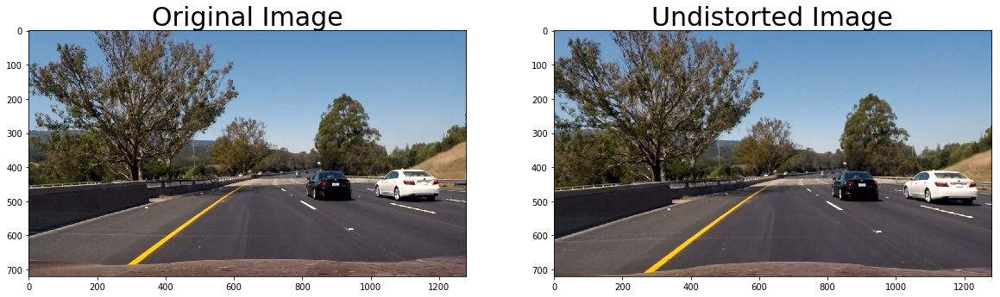

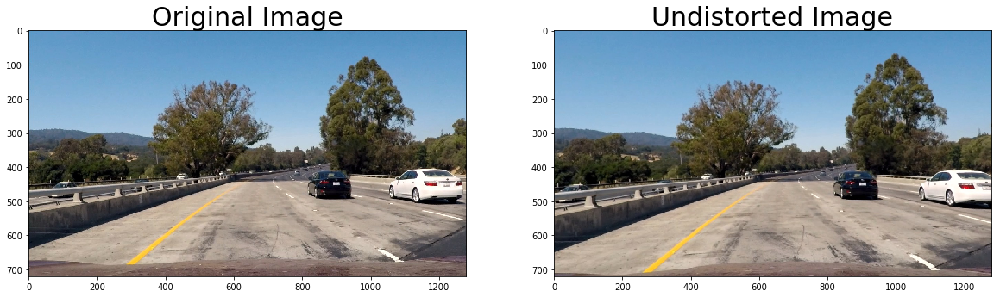

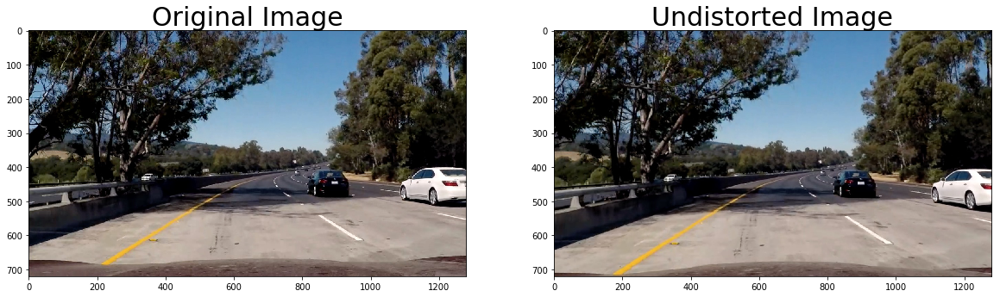

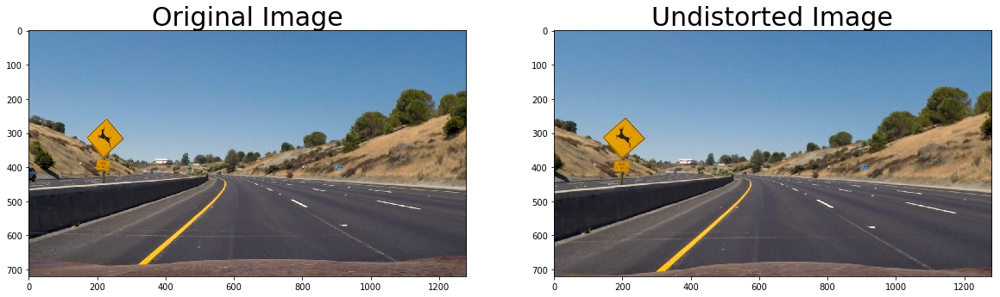

In [118]:
image_in_folder = 'test_images/'
files = [x for x in os.listdir(image_in_folder) if x.endswith('.jpg')]
images = []
for file in files:
    images.append(undistort(mtx,dist,
                            os.path.join(image_in_folder,file),
                            plot = True))

<function __main__.test_dir>

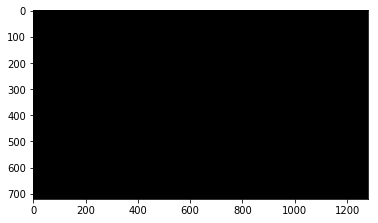

In [4]:
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML
import utils

def test_dir(kernel_size, thresh_min, thresh_max):
    img_test = utils.gaussian_blur(images[0],9)

    dir_bin = utils.dir_thresh(img_test,kernel_size, 
                               thresh=(thresh_min, thresh_max))
    plt.imshow(dir_bin,cmap='gray')

    #dir_bin = utils.dir_thresh(img_test,15,thresh=(0.73, 1.16))
interact(test_dir,kernel_size=(1,31,2), 
         thresh_min=(0,np.pi/2,0.01), 
         thresh_max=(0,np.pi/2,0.01))

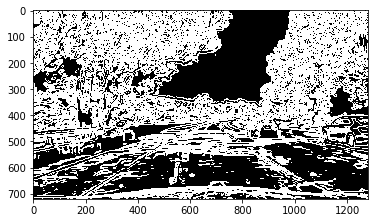

In [5]:
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML
import utils

def test_mag(kernel_size, thresh_min, thresh_max):
    img_test = utils.gaussian_blur(images[0],9)

    mag_bin = utils.mag_thresh(img_test,kernel_size, 
                               thresh=(thresh_min, thresh_max))
    mag_bin = utils.mag_thresh(img_test,kernel_size, thresh=(8, 72))
    plt.imshow(mag_bin,cmap='gray')

interact(test_mag,kernel_size=(1,31,2), 
         thresh_min=(0,50), 
         thresh_max=(0,100))

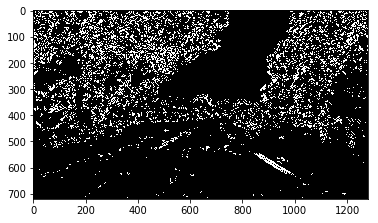

In [7]:
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML
def test_mag_dir( mag_min_thresh, mag_max_thresh, 
                  dir_min_thresh, dir_max_thresh):
    img_test = utils.gaussian_blur(images[0],9)

    dir_bin = utils.dir_thresh(img_test, 15, thresh=(dir_min_thresh, dir_max_thresh))
    mag_bin = utils.mag_thresh(img_test, 15, thresh=(mag_min_thresh, mag_max_thresh))
    combined = np.zeros_like(dir_bin)
    combined[((dir_bin == 1) & (mag_bin == 1))] = 1
    plt.imshow(combined,cmap='gray')

interact(test_mag_dir,
         mag_min_thresh=(0,255), 
         mag_max_thresh=(0,255),
         dir_min_thresh=(0,np.pi/2,0.01), 
         dir_max_thresh=(0,np.pi/2,0.01))

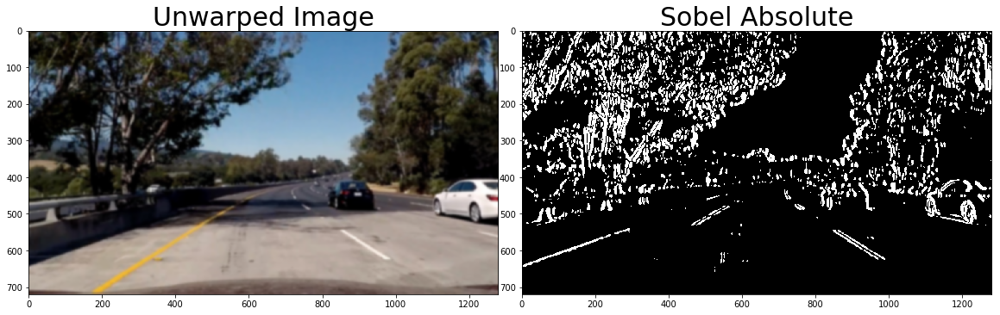

In [9]:
def test_abs_thresh(kernel_size, min_thresh, max_thresh):
    img_test = utils.gaussian_blur(images[0],kernel_size)
    test_out = utils.abs_sobel_thresh(img_test, 'x',
                                     thresh=(min_thresh, max_thresh))
    # Visualize sobel absolute threshold
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(img_test)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(test_out, cmap='gray')
    ax2.set_title('Sobel Absolute', fontsize=30)
    
# kernel 9, min 18, max 255
interact(test_abs_thresh,
         kernel_size=(1,31,2),
         min_thresh=(0,100,1), 
         max_thresh=(0,255))

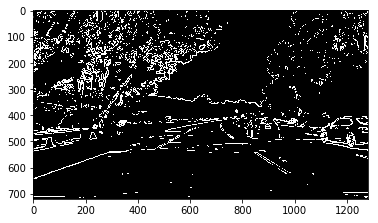

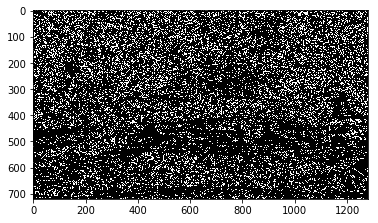

In [16]:
# for image in images:
image = images[0]
image_new = pipeline1(image)

# f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
# f.tight_layout()
# ax1.imshow(image)
# ax1.set_title('Original Image', fontsize=50)
# ax2.imshow(image_new,cmap='gray')
# ax2.set_title('Processed Image', fontsize=50)
# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



In [119]:
import utils

def poly_fit(img):
    print("Initial search")
    histogram = np.sum(img[int(img.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((img, img, img))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines

    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
#     print("left base {},right base {}".format(leftx_base,rightx_base))

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
#     print("Using window height {}".format(window_height))

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero  = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

#         # Draw the windows on the visualization image
#         cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
#         cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit,right_fit = None,None
    if lefty.any() and leftx.any():
        left_fit = np.polyfit(lefty, leftx, 2)
    if righty.any() and rightx.any():
        right_fit = np.polyfit(righty, rightx, 2)
#     print(left_fit)
#     print(right_fit)
    return left_fit, right_fit


def poly_fit_update(img, left_fit, right_fit):
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & 
                     (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & 
                        (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit,right_fit = None,None
    if lefty.any() and leftx.any():
        left_fit = np.polyfit(lefty, leftx, 2)
    if righty.any() and rightx.any():
        right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit


def curvature(ploty,leftx,rightx):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
#     print(left_curverad, 'm', right_curverad, 'm')
#     print(left_fit_cr[0]*y_eval*ym_per_pix, 'm', right_fit_cr[0]*y_eval*ym_per_pix, 'm')
    return left_curverad,right_curverad

def draw_lane(img,ploty,left_fitx,right_fitx):
    img_new = img.copy()
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(img).astype(np.uint8)
    color_warp = warp_zero #np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, (img.shape[1], img.shape[0])) 
    
    # Combine the result with the original image
    img_new = cv2.addWeighted(img_new, 1, newwarp, 0.3, 0)
    return img_new

def draw_info(img, curv_l, curv_r, dist_l,dist_r):
    img_new = np.copy(img)
    h = img_new.shape[0]
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = 'Curvature Left : {:4.2f}'.format(curv_l) + 'm'
    cv2.putText(img_new, text, (40,70), font, 1, (255,255,255), 2, cv2.LINE_AA)
    text = 'Curvature right : {:4.2f}'.format(curv_r) + 'm'
    cv2.putText(img_new, text, (40,100), font, 1, (255,255,255), 2, cv2.LINE_AA)
    text = 'Distance to left : {:4.2f}'.format(dist_l) + 'm'
    cv2.putText(img_new, text, (40,130), font, 1, (255,255,255), 2, cv2.LINE_AA)
    text = 'Distance to left : {:4.2f}'.format(dist_r) + 'm'
    cv2.putText(img_new, text, (40,160), font, 1, (255,255,255), 2, cv2.LINE_AA)
    return img_new

def get_poly_point(poly,x):
    return poly[0]*x*x+poly[1]*x+poly[2]

In [126]:
def select(img):
    filtered = utils.gaussian_blur(img,9)
    s = utils.hls_select(filtered,thresh=(100, 255))
    
    grad_x= utils.abs_sobel_thresh(filtered, 'x',thresh=(32, 255))
    grad_y= utils.abs_sobel_thresh(filtered, 'y',thresh=(32, 255))
    
    dir_bin = utils.dir_thresh(filtered,15, thresh=(0.63, 1.))
    mag_bin = utils.mag_thresh(filtered,15, thresh=(70, 78))

    combined = np.zeros_like(mag_bin)
    combined[((grad_x == 1) ) | 
             ((mag_bin == 1) & (dir_bin == 1)) |
             s > 0] = 1
    
    return combined

def pipeline(img):
    undistort = cv2.undistort(img, mtx, dist, None, mtx)
    img_bin = select(undistort)
    warped = cv2.warpPerspective(img_bin, M, img_size, flags=cv2.INTER_LINEAR)
    
    if l_line.best_fit == None or r_line.best_fit == None:
        left_fit,right_fit = poly_fit(warped)
    else:
        left_fit,right_fit = poly_fit_update(warped,l_line.best_fit,r_line.best_fit)
     
    l_line.add_poly_fit(left_fit)
    r_line.add_poly_fit(right_fit)
    
    
    # Generate x and y values for plotting
    left_fitx = l_line.best_fit[0]*ploty**2 + l_line.best_fit[1]*ploty + l_line.best_fit[2]
    right_fitx = r_line.best_fit[0]*ploty**2 + r_line.best_fit[1]*ploty + r_line.best_fit[2]
    
    result = draw_lane(undistort,ploty,left_fitx,right_fitx)
    result = draw_info(result,l_line.radius_of_curvature,r_line.radius_of_curvature,
                       l_line.line_base_pos,r_line.line_base_pos)
    return result

def pipeline_resized(img):
    result = pipeline(img)
    return cv2.resize(result, (320, 180))
# Define a class to receive the characteristics of each line detection

class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.momemtum = 0.4 
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        self.diffs_sum = np.array([0,0,0], dtype='float') 
        self.test_count = 0
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
    def add_poly_fit(self,poly_fit):
#         print("poly_fit",poly_fit)
        if poly_fit == None:
            self.detected = False
        else:
            self.detected = True
            
            if self.best_fit == None:
                self.best_fit = poly_fit
                
            self.diffs = abs(poly_fit - self.best_fit)
            self.diffs_sum = self.diffs_sum + self.diffs
            self.test_count = self.test_count +1
#             print(self.diffs)
            if self.diffs[0] > 1.4e-04 or self.diffs[1] > 1.0e-01 or self.diffs[2] > 20. :
                self.detected = False
                momemtum = self.momemtum * 0.2
                print("bad detection",self.diffs)
            else:
                momemtum = self.momemtum
                
            self.best_fit[0] = self.best_fit[0]*(1-momemtum) + poly_fit[0]*momemtum
            self.best_fit[1] = self.best_fit[1]*(1-momemtum) + poly_fit[1]*momemtum
            self.best_fit[2] = self.best_fit[2]*(1-momemtum) + poly_fit[2]*momemtum
#                 print("self.current_fit ",self.current_fit)
    
            # Define y-value where we want radius of curvature
            # I'll choose the maximum y-value, corresponding to the bottom of the image
            y_eval = np.max(ploty)
            self.line_base_pos = abs(get_poly_point(self.best_fit, y_eval)-img_size[0]/2) * xm_per_pix

            # Calculate the new radii of curvature
            self.radius_of_curvature = ((1 +(2*self.best_fit[0]*y_eval*ym_per_pix + self.best_fit[1])**2)**1.5) / np.absolute(2*self.best_fit[0])

    def mean_diff(self):
        return self.diffs_sum/self.test_count

# img_bin = select(images[0])
# warped = cv2.warpPerspective(img_bin, M, img_size, flags=cv2.INTER_LINEAR)
# f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
# f.tight_layout()
# ax1.imshow(img_bin,cmap='gray')
# ax1.set_title('Original Image', fontsize=50)
# ax2.imshow(warped,cmap='gray')
# ax2.set_title('Processed Image', fontsize=50)
# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# plt.show()

In [121]:
# Mean polynomial:
# curve road		L 	[  1.18180920e-05   7.80891282e-03   1.51736282e+00]
#             	    R	[  4.46696746e-05   3.21652172e-02   7.67916775e+00]
# straight road	    L 	[  7.57506233e-06   7.05633821e-03   3.65587183e+00]
#             	    R	[  3.13976960e-05   2.05890272e-02   5.05038335e+00]
# different round	L 	[  2.59277283e-05   2.85054620e-02   1.19792455e+01]
# 				    R	[  5.60560312e-05   3.47728916e-02   8.93921383e+00]
# shadow road		L 	[  3.52839926e-05   3.00916186e-02   1.03260225e+01]
# 				    R	[  1.39808593e-04   1.25237837e-01   3.13900015e+01]

Initial search


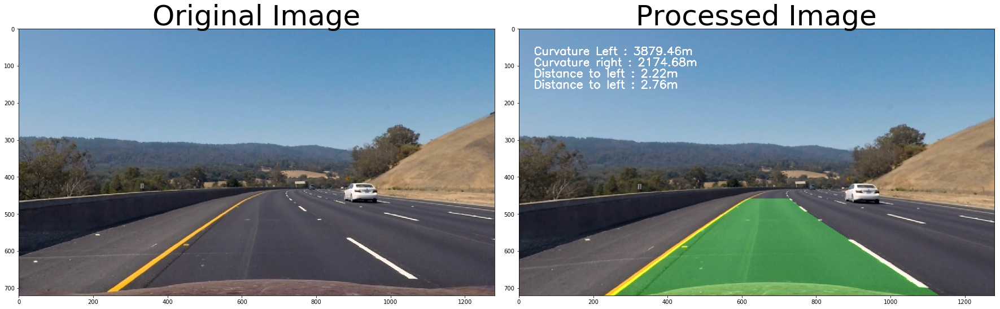

bad detection [  2.42005464e-05   1.21415152e-01   6.83953449e+01]
bad detection [  1.64241993e-04   1.32151245e-02   2.05758225e+01]


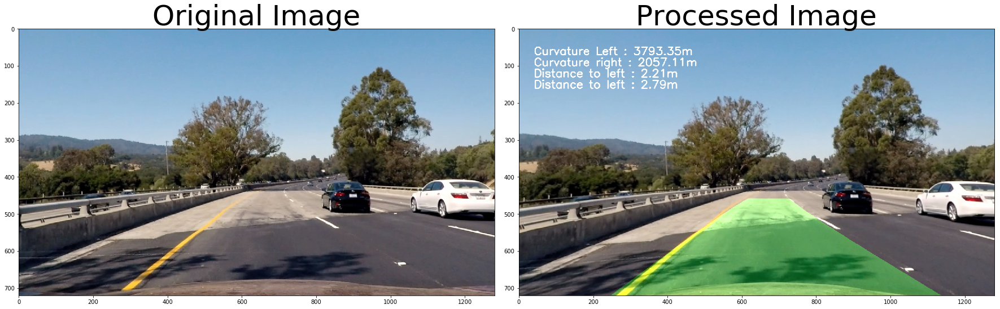

bad detection [  4.84623055e-05   8.40196561e-02   1.04347887e+02]
bad detection [  1.13829325e-04   1.62434574e-01   1.00300447e+02]


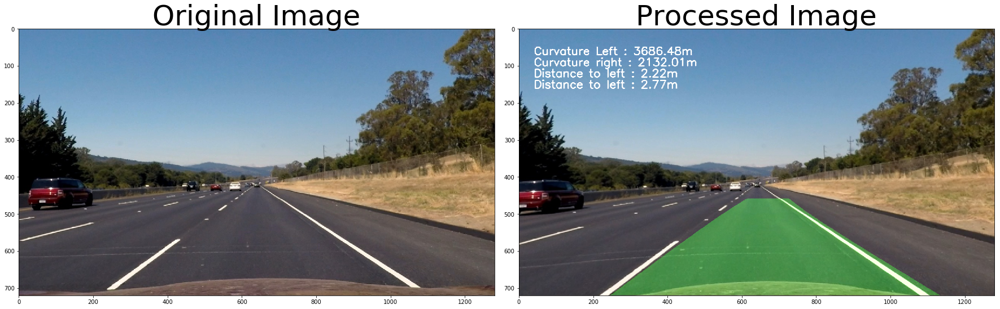

bad detection [  3.70349335e-05   1.30782562e-01   1.03891210e+02]
bad detection [  8.41666457e-05   1.45002682e-01   1.07176590e+02]


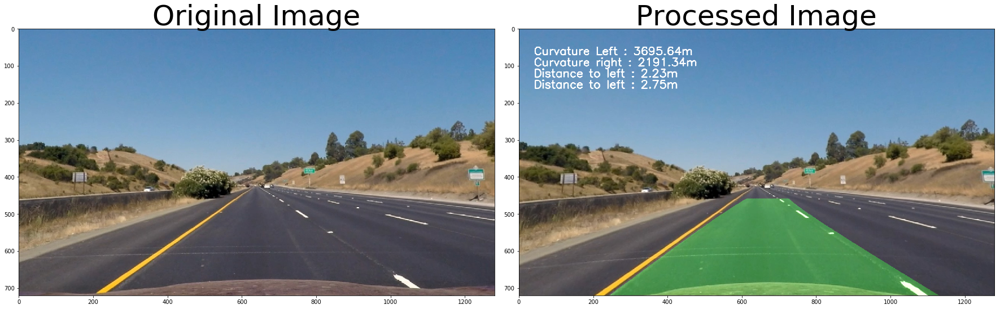

bad detection [  1.13844613e-05   1.73096306e-02   4.04882660e+01]
bad detection [  4.18205841e-05   4.60481880e-02   3.54938623e+01]


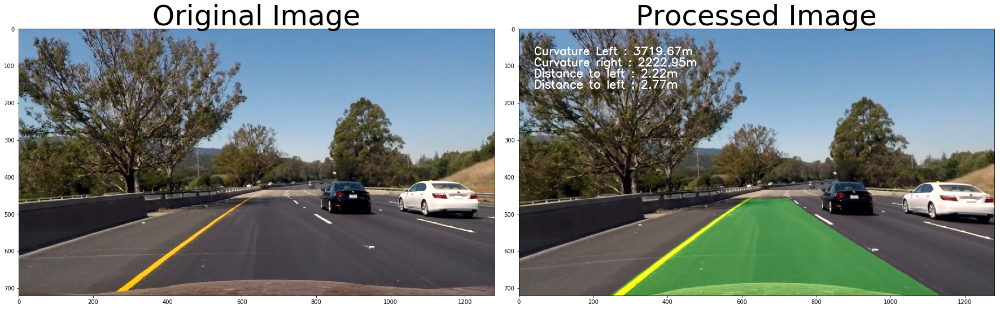

bad detection [  5.28997705e-05   5.21341498e-02   5.55085557e+01]


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


bad detection [  3.15549584e-04   3.83063191e-01   4.21061634e+01]
bad detection [  4.44099744e-05   3.61055720e-02   3.93979877e+01]


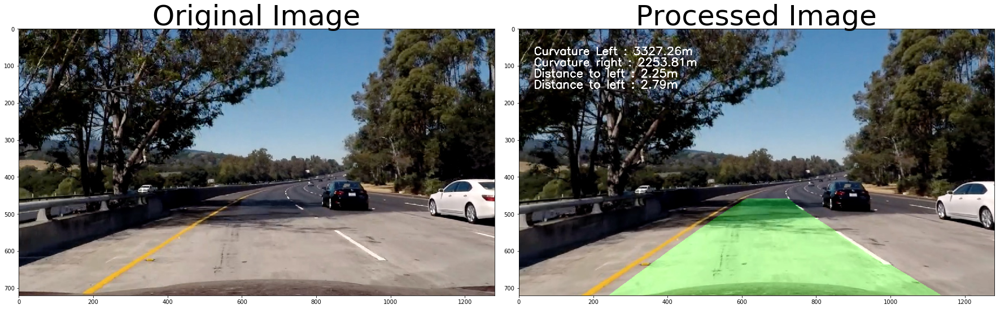

bad detection [  3.13160490e-04   5.50325296e-01   1.71130302e+02]
bad detection [  5.48173346e-04   6.31237288e-01   1.72208519e+02]


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


[  1.00336511e-04   1.67381205e-01   7.32334661e+01]
[  1.26739242e-04   1.32479989e-01   5.96910776e+01]


In [122]:
l_line = Line()
r_line = Line()
for image in images:
    image_new = pipeline(image)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(image_new)
    ax2.set_title('Processed Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    plt.show()
    
print(l_line.mean_diff())
print(r_line.mean_diff())

In [123]:
from moviepy.editor import VideoFileClip
l_line = Line()
r_line = Line()
video_output = 'project_video_output.mp4'
video_input = VideoFileClip('project_video.mp4')
processed_video = video_input.fl_image(pipeline)
processed_video.write_videofile(video_output, audio=False)

Initial search
[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4



  1%|          | 12/1261 [00:04<07:24,  2.81it/s]

bad detection [  4.92692033e-05   6.06596179e-02   2.06951518e+01]



  1%|          | 14/1261 [00:04<07:23,  2.81it/s]

bad detection [  1.54741864e-04   1.09178491e-01   1.62419639e+01]



  1%|          | 15/1261 [00:05<07:26,  2.79it/s]

bad detection [  1.12159885e-04   1.02682395e-01   3.04379942e+01]



  1%|▏         | 16/1261 [00:05<07:20,  2.83it/s]

bad detection [  3.95346514e-05   5.73771821e-02   3.42652425e+01]



  1%|▏         | 17/1261 [00:06<07:16,  2.85it/s]

bad detection [  6.73846875e-06   2.56996635e-02   2.86623407e+01]



  1%|▏         | 18/1261 [00:06<07:14,  2.86it/s]

bad detection [  1.43349849e-05   1.03082021e-02   2.90754695e+01]



  2%|▏         | 27/1261 [00:09<07:17,  2.82it/s]

bad detection [  1.48617267e-04   1.03800408e-01   8.63622111e+00]



  3%|▎         | 37/1261 [00:13<07:20,  2.78it/s]

bad detection [  1.51716218e-04   1.12884966e-01   2.31222442e+01]



  3%|▎         | 38/1261 [00:13<07:14,  2.81it/s]

bad detection [  3.04684626e-04   2.18384348e-01   3.90683106e+01]



  3%|▎         | 39/1261 [00:13<07:20,  2.78it/s]

bad detection [  2.01646691e-04   1.67414012e-01   4.06806459e+01]



  3%|▎         | 40/1261 [00:14<07:20,  2.77it/s]

bad detection [  1.25182356e-04   1.13755488e-01   3.04265124e+01]



  3%|▎         | 41/1261 [00:14<07:13,  2.81it/s]

bad detection [  7.03964216e-05   7.84104979e-02   2.61368387e+01]



  4%|▍         | 51/1261 [00:17<07:07,  2.83it/s]

bad detection [  1.86851609e-04   1.31545310e-01   1.86223882e+01]



  4%|▍         | 52/1261 [00:18<07:08,  2.82it/s]

bad detection [  1.85320107e-04   1.53088540e-01   3.20117145e+01]



  4%|▍         | 53/1261 [00:18<07:08,  2.82it/s]

bad detection [  9.75327739e-05   9.50842540e-02   2.76855922e+01]



  4%|▍         | 54/1261 [00:19<07:04,  2.84it/s]

bad detection [  2.42897691e-05   4.71571357e-02   2.48170575e+01]



  5%|▍         | 61/1261 [00:21<07:13,  2.77it/s]

bad detection [  1.13709101e-04   8.28988697e-02   2.38823589e+01]



  5%|▍         | 62/1261 [00:21<07:06,  2.81it/s]

bad detection [  1.10506036e-04   9.48748753e-02   3.21464336e+01]



  6%|▌         | 74/1261 [00:26<07:12,  2.75it/s]

bad detection [  1.98572563e-04   1.20108700e-01   1.30848269e+01]



  6%|▌         | 75/1261 [00:26<07:17,  2.71it/s]

bad detection [  1.64005790e-04   9.66117168e-02   5.43059479e+00]



  6%|▌         | 76/1261 [00:27<07:17,  2.71it/s]

bad detection [  2.22886585e-04   1.36357122e-01   1.20116202e+01]



  6%|▌         | 77/1261 [00:27<07:14,  2.73it/s]

bad detection [  1.61283528e-04   8.68452178e-02   5.30973805e+00]



  7%|▋         | 84/1261 [00:29<07:12,  2.72it/s]

bad detection [  1.30053582e-04   9.19410866e-02   2.38305342e+01]



  7%|▋         | 85/1261 [00:30<07:06,  2.75it/s]

bad detection [  9.29387829e-05   7.00728271e-02   2.00412523e+01]



  7%|▋         | 88/1261 [00:31<07:03,  2.77it/s]

bad detection [  2.43750618e-04   1.80816139e-01   3.68746646e+01]



  7%|▋         | 89/1261 [00:31<07:00,  2.78it/s]

bad detection [  1.52343701e-04   1.33176104e-01   3.63591192e+01]



  7%|▋         | 90/1261 [00:32<06:57,  2.80it/s]

bad detection [  4.04571411e-05   7.16681164e-02   3.80218565e+01]



  7%|▋         | 91/1261 [00:32<06:59,  2.79it/s]

bad detection [  2.43353236e-06   2.63954209e-02   2.10008116e+01]



  8%|▊         | 101/1261 [00:35<06:33,  2.95it/s]

bad detection [  1.90271371e-04   1.27892710e-01   1.46453776e+01]



  8%|▊         | 106/1261 [00:37<06:44,  2.85it/s]

bad detection [  6.06499981e-05   5.63091365e-02   2.09355773e+01]



  8%|▊         | 107/1261 [00:38<06:46,  2.84it/s]

bad detection [  7.02168688e-05   6.87187342e-02   2.88582560e+01]



  9%|▊         | 108/1261 [00:38<06:45,  2.84it/s]

bad detection [  7.22518501e-05   6.06114939e-02   2.17311090e+01]



  9%|▊         | 109/1261 [00:38<06:50,  2.81it/s]

bad detection [  8.08641580e-05   6.73839635e-02   2.30923598e+01]



  9%|▊         | 110/1261 [00:39<06:46,  2.83it/s]

bad detection [  5.52218497e-05   4.88681295e-02   2.08452134e+01]



  9%|▉         | 111/1261 [00:39<06:47,  2.82it/s]

bad detection [  7.60931616e-05   5.99759565e-02   2.04364357e+01]



  9%|▉         | 112/1261 [00:39<06:47,  2.82it/s]

bad detection [  4.91313102e-05   5.93361204e-02   3.20835302e+01]



  9%|▉         | 114/1261 [00:40<06:46,  2.82it/s]

bad detection [  2.37766681e-04   1.65517206e-01   1.47467327e+01]



  9%|▉         | 115/1261 [00:40<06:50,  2.79it/s]

bad detection [  1.58166906e-04   1.36916194e-01   2.10194230e+01]



 10%|▉         | 124/1261 [00:44<06:40,  2.84it/s]

bad detection [  1.28568576e-04   1.02420423e-01   2.10356291e+01]



 10%|▉         | 125/1261 [00:44<06:39,  2.84it/s]

bad detection [  1.24930887e-04   1.12647112e-01   2.58227806e+01]



 12%|█▏        | 148/1261 [00:52<06:34,  2.82it/s]

bad detection [  1.97374271e-04   1.45422040e-01   3.25025614e+01]



 12%|█▏        | 149/1261 [00:52<06:36,  2.80it/s]

bad detection [  2.01366185e-04   1.51316652e-01   3.23798910e+01]



 12%|█▏        | 150/1261 [00:53<06:34,  2.82it/s]

bad detection [  1.74534628e-04   1.21698476e-01   2.03838420e+01]



 12%|█▏        | 151/1261 [00:53<06:34,  2.81it/s]

bad detection [  2.23377482e-04   1.43656856e-01   1.87791728e+01]



 12%|█▏        | 152/1261 [00:54<06:35,  2.80it/s]

bad detection [  1.43279732e-04   9.00136434e-02   8.53037834e+00]



 14%|█▍        | 174/1261 [01:01<06:25,  2.82it/s]

bad detection [  2.51877549e-04   1.90548086e-01   4.17889329e+01]



 14%|█▍        | 175/1261 [01:02<06:21,  2.85it/s]

bad detection [  2.74448054e-04   2.27467609e-01   5.34443730e+01]



 14%|█▍        | 176/1261 [01:02<06:22,  2.84it/s]

bad detection [  3.08695138e-04   2.50517127e-01   5.57329724e+01]



 14%|█▍        | 177/1261 [01:02<06:18,  2.86it/s]

bad detection [  2.64809874e-04   2.09848067e-01   3.83526481e+01]



 14%|█▍        | 178/1261 [01:03<06:22,  2.83it/s]

bad detection [  1.96310761e-04   1.70627454e-01   3.04257699e+01]



 14%|█▍        | 179/1261 [01:03<06:22,  2.83it/s]

bad detection [  1.40504335e-04   1.38294858e-01   2.42441512e+01]



 15%|█▍        | 185/1261 [01:05<06:15,  2.86it/s]

bad detection [  5.86727257e-05   6.74615398e-02   2.37674246e+01]



 15%|█▍        | 186/1261 [01:06<06:17,  2.85it/s]

bad detection [  3.90185740e-05   8.52247192e-02   4.38641155e+01]



 15%|█▍        | 187/1261 [01:06<06:14,  2.87it/s]

bad detection [  4.50044851e-05   8.49875583e-02   4.16539362e+01]



 15%|█▍        | 188/1261 [01:06<06:11,  2.89it/s]

bad detection [  4.23933570e-05   9.32266738e-02   4.87032678e+01]



 15%|█▍        | 189/1261 [01:07<06:10,  2.89it/s]

bad detection [  1.75070735e-07   5.26111912e-02   3.75577770e+01]



 15%|█▌        | 190/1261 [01:07<06:12,  2.88it/s]

bad detection [  5.22588457e-05   1.12397505e-02   3.01044607e+01]



 15%|█▌        | 191/1261 [01:07<06:16,  2.84it/s]

bad detection [  7.18751655e-05   3.07081608e-03   3.00465212e+01]



 16%|█▌        | 196/1261 [01:09<06:12,  2.86it/s]

bad detection [  5.56536891e-05   8.99220018e-02   3.65930472e+01]



 16%|█▌        | 197/1261 [01:09<06:13,  2.85it/s]

bad detection [  9.03299921e-05   1.42352548e-01   6.16668953e+01]



 16%|█▌        | 198/1261 [01:10<06:13,  2.84it/s]

bad detection [  6.64993671e-05   1.46422775e-01   7.62415914e+01]



 16%|█▌        | 199/1261 [01:10<06:13,  2.84it/s]

bad detection [  1.89490980e-05   1.17863636e-01   7.94610752e+01]



 16%|█▌        | 200/1261 [01:10<06:13,  2.84it/s]

bad detection [  9.84529709e-05   1.67335160e-01   7.99062145e+01]



 16%|█▌        | 201/1261 [01:11<06:10,  2.86it/s]

bad detection [  1.44175404e-04   2.00533409e-01   8.38693551e+01]



 16%|█▌        | 202/1261 [01:11<06:08,  2.88it/s]

bad detection [  5.02656997e-05   1.07098017e-01   5.45626151e+01]



 16%|█▌        | 203/1261 [01:11<06:11,  2.85it/s]

bad detection [  7.29971725e-05   1.20390203e-02   2.38247240e+01]



 16%|█▌        | 204/1261 [01:12<06:11,  2.84it/s]

bad detection [  1.58860978e-05   2.31606125e-02   2.50284042e+01]



 17%|█▋        | 211/1261 [01:14<06:09,  2.84it/s]

bad detection [  2.96538836e-05   5.36564375e-02   2.60778305e+01]



 18%|█▊        | 224/1261 [01:19<06:04,  2.84it/s]

bad detection [  1.33891881e-04   9.97866825e-02   2.41276622e+01]



 18%|█▊        | 225/1261 [01:19<06:07,  2.82it/s]

bad detection [  2.07558051e-04   1.37548980e-01   2.31850655e+01]



 18%|█▊        | 226/1261 [01:20<06:10,  2.80it/s]

bad detection [  1.40191165e-04   1.08817829e-01   2.86266813e+01]



 19%|█▊        | 236/1261 [01:23<06:06,  2.79it/s]

bad detection [  1.14493448e-04   1.01102874e-01   2.92033865e+01]



 19%|█▉        | 237/1261 [01:24<06:05,  2.80it/s]

bad detection [  2.29727672e-04   1.73107025e-01   3.63043296e+01]



 19%|█▉        | 238/1261 [01:24<06:06,  2.79it/s]

bad detection [  1.83560509e-04   1.58561829e-01   3.91526789e+01]



 19%|█▉        | 239/1261 [01:24<06:03,  2.81it/s]

bad detection [  1.36876487e-04   1.37280574e-01   4.01612068e+01]



 19%|█▉        | 240/1261 [01:25<06:03,  2.81it/s]

bad detection [  7.53390449e-05   9.27636837e-02   3.11189420e+01]



 19%|█▉        | 241/1261 [01:25<06:04,  2.80it/s]

bad detection [  4.34869526e-05   6.66928870e-02   2.60820785e+01]



 20%|██        | 254/1261 [01:30<05:57,  2.82it/s]

bad detection [  7.25367655e-05   7.04232707e-02   2.03140604e+01]



 21%|██        | 266/1261 [01:34<06:11,  2.68it/s]

bad detection [  6.65521413e-05   6.41452287e-02   2.37190427e+01]



 21%|██▏       | 269/1261 [01:35<06:04,  2.72it/s]

bad detection [  3.54587357e-05   4.24114765e-02   2.03012232e+01]



 21%|██▏       | 270/1261 [01:35<05:59,  2.75it/s]

bad detection [  7.98127873e-05   6.44684216e-02   2.00520957e+01]



 22%|██▏       | 272/1261 [01:36<06:06,  2.70it/s]

bad detection [  1.55278790e-04   1.25497261e-01   2.57151931e+01]



 23%|██▎       | 288/1261 [01:42<05:48,  2.79it/s]

bad detection [  5.01934358e-05   4.54019274e-02   2.00777658e+01]



 24%|██▍       | 305/1261 [01:48<05:55,  2.69it/s]

bad detection [  1.42606707e-04   8.13280436e-02   1.36000068e+01]



 25%|██▌       | 317/1261 [01:52<05:38,  2.79it/s]

bad detection [  9.21451114e-05   7.67688518e-02   2.33726277e+01]



 25%|██▌       | 318/1261 [01:53<05:36,  2.80it/s]

bad detection [  1.59323631e-04   8.82008042e-02   7.51317819e+00]



 25%|██▌       | 319/1261 [01:53<05:43,  2.75it/s]

bad detection [  1.67789891e-04   8.66490647e-02   1.38708247e+00]



 26%|██▌       | 329/1261 [01:57<05:20,  2.91it/s]

bad detection [  5.21153316e-05   4.55701260e-02   2.14544100e+01]



 27%|██▋       | 342/1261 [02:01<05:23,  2.84it/s]

bad detection [  1.33807203e-04   1.01894129e-01   2.44143929e+01]



 28%|██▊       | 357/1261 [02:06<05:21,  2.81it/s]

bad detection [  1.50173995e-04   1.13366083e-01   2.23993725e+01]



 35%|███▍      | 440/1261 [02:37<04:51,  2.81it/s]

bad detection [  1.33030587e-04   1.02174217e-01   2.54005266e+01]



 35%|███▍      | 441/1261 [02:37<04:53,  2.80it/s]

bad detection [  1.53297222e-04   1.16433263e-01   2.34031684e+01]



 35%|███▌      | 442/1261 [02:38<04:49,  2.83it/s]

bad detection [  1.41372730e-04   1.05331878e-01   2.05343061e+01]



 39%|███▉      | 489/1261 [02:54<04:40,  2.76it/s]

bad detection [  1.34517593e-04   1.07098245e-01   2.42984022e+01]



 39%|███▉      | 490/1261 [02:55<04:39,  2.76it/s]

bad detection [  1.32390174e-04   1.09327160e-01   2.42124170e+01]



 39%|███▉      | 491/1261 [02:55<04:35,  2.79it/s]

bad detection [  1.06425475e-04   9.69588554e-02   2.44262706e+01]



 40%|████      | 509/1261 [03:02<04:28,  2.80it/s]

bad detection [  1.47239574e-04   8.06743284e-02   8.17731765e+00]



 40%|████      | 510/1261 [03:02<04:27,  2.80it/s]

bad detection [  1.65810969e-04   9.67993322e-02   7.28773732e+00]



 42%|████▏     | 531/1261 [03:10<04:25,  2.75it/s]

bad detection [  7.31445542e-05   7.35436379e-02   2.22517783e+01]



 42%|████▏     | 532/1261 [03:10<04:26,  2.73it/s]

bad detection [  5.29145626e-05   6.77643785e-02   2.93052764e+01]
bad detection [  4.13437796e-06   2.75287415e-02   2.55141087e+01]



 42%|████▏     | 533/1261 [03:10<04:26,  2.73it/s]

bad detection [  4.68635086e-05   5.96421647e-02   2.67357820e+01]
bad detection [  2.03516629e-04   1.61422739e-01   4.40311289e+01]



 42%|████▏     | 534/1261 [03:11<04:28,  2.71it/s]

bad detection [  5.34636184e-05   6.05077572e-02   2.48951960e+01]
bad detection [  2.23557147e-04   1.76266411e-01   4.40795988e+01]



 42%|████▏     | 535/1261 [03:11<04:27,  2.72it/s]

bad detection [  2.08004983e-04   1.64888608e-01   3.54354442e+01]



 43%|████▎     | 536/1261 [03:11<04:23,  2.75it/s]

bad detection [  2.05802692e-04   1.71168080e-01   3.06646763e+01]



 44%|████▎     | 550/1261 [03:16<04:19,  2.74it/s]

bad detection [  4.33788159e-05   4.84503457e-02   2.05480647e+01]
bad detection [  1.31082864e-05   3.02620763e-02   2.13829099e+01]



 44%|████▎     | 551/1261 [03:17<04:14,  2.79it/s]

bad detection [  5.00263898e-05   5.80738686e-02   2.48669149e+01]



 44%|████▍     | 552/1261 [03:17<04:14,  2.78it/s]

bad detection [  7.51955459e-05   8.25446359e-02   3.26089124e+01]



 44%|████▍     | 553/1261 [03:18<04:12,  2.80it/s]

bad detection [  6.38608045e-05   7.20033847e-02   2.95153355e+01]



 44%|████▍     | 554/1261 [03:18<04:13,  2.79it/s]

bad detection [  4.29509200e-05   7.29011032e-02   3.25366698e+01]



 44%|████▍     | 555/1261 [03:18<04:10,  2.82it/s]

bad detection [  2.26930082e-06   4.44003810e-02   2.64241916e+01]



 44%|████▍     | 559/1261 [03:20<04:07,  2.84it/s]

bad detection [  1.62897721e-04   8.31801596e-02   1.92546975e+01]



 44%|████▍     | 560/1261 [03:20<04:11,  2.78it/s]

bad detection [  5.16094972e-05   2.30085684e-02   5.03040953e+01]
bad detection [  1.53347467e-04   3.59847799e-02   6.52080808e+01]



 44%|████▍     | 561/1261 [03:20<04:10,  2.79it/s]

bad detection [  4.98671068e-05   2.13826018e-02   5.56442688e+01]
bad detection [  3.26620337e-05   4.99417524e-02   7.78972324e+01]



 45%|████▍     | 562/1261 [03:21<04:09,  2.80it/s]

bad detection [  7.42137937e-06   5.61327730e-02   6.65763749e+01]
bad detection [  5.49568241e-05   3.13917754e-02   8.01690451e+01]



 45%|████▍     | 563/1261 [03:21<04:11,  2.78it/s]

bad detection [  3.97676580e-06   6.24322975e-03   2.42240622e+01]
bad detection [  1.65645172e-04   1.85215159e-01   7.16226100e+01]



 45%|████▍     | 566/1261 [03:22<04:09,  2.79it/s]

bad detection [  1.11245522e-05   3.48458304e-02   3.19237752e+01]
bad detection [  9.23308191e-05   1.52604048e-03   3.40037888e+01]



 45%|████▍     | 567/1261 [03:23<04:13,  2.74it/s]

bad detection [  3.49663493e-06   4.33341046e-02   3.58336798e+01]
bad detection [  1.04004154e-05   4.69537050e-02   4.53328533e+01]



 45%|████▌     | 568/1261 [03:23<04:09,  2.78it/s]

bad detection [  1.16437815e-05   3.84883467e-02   3.24931808e+01]
bad detection [  1.27099452e-04   1.45945668e-01   5.78336860e+01]



 45%|████▌     | 569/1261 [03:23<04:06,  2.81it/s]

bad detection [  2.16893608e-05   3.23384928e-02   2.07962090e+01]
bad detection [  2.13237352e-04   1.91296832e-01   4.92811791e+01]



 45%|████▌     | 570/1261 [03:24<04:05,  2.81it/s]

bad detection [  2.56122853e-04   2.15055760e-01   4.39492268e+01]



 45%|████▌     | 571/1261 [03:24<04:02,  2.84it/s]

bad detection [  2.14100739e-04   1.52423593e-01   1.54225404e+01]



 45%|████▌     | 572/1261 [03:24<04:01,  2.85it/s]

bad detection [  2.09576206e-04   1.72356740e-01   2.58447591e+01]



 45%|████▌     | 573/1261 [03:25<04:03,  2.82it/s]

bad detection [  1.81928500e-04   1.46806653e-01   1.53578937e+01]



 46%|████▌     | 574/1261 [03:25<04:04,  2.81it/s]

bad detection [  1.22224249e-04   1.13014885e-01   1.37450911e+01]



 46%|████▌     | 577/1261 [03:26<04:06,  2.77it/s]

bad detection [  7.39784122e-05   8.03508842e-02   2.52939812e+01]
bad detection [  7.70820339e-06   5.31523907e-02   2.11358468e+01]



 46%|████▌     | 578/1261 [03:26<04:05,  2.79it/s]

bad detection [  8.89726753e-05   9.62189108e-02   3.13597327e+01]
bad detection [  3.83959607e-05   7.35457751e-02   3.13598062e+01]



 46%|████▌     | 579/1261 [03:27<04:02,  2.81it/s]

bad detection [  8.00622085e-07   2.60429589e-02   2.07308946e+01]
bad detection [  7.84427256e-05   1.13045653e-01   4.64187400e+01]



 46%|████▌     | 580/1261 [03:27<04:02,  2.81it/s]

bad detection [  4.59711609e-05   9.38050751e-02   4.13480093e+01]



 46%|████▌     | 581/1261 [03:28<04:03,  2.79it/s]

bad detection [  4.66141825e-04   2.51421986e-01   6.48518857e+00]



 46%|████▌     | 582/1261 [03:28<04:04,  2.78it/s]

bad detection [  2.75947701e-04   1.43539518e-01   5.05226405e+00]



 46%|████▌     | 583/1261 [03:28<04:01,  2.81it/s]

bad detection [  1.59655776e-04   7.56601289e-02   1.59588813e+01]



 46%|████▋     | 584/1261 [03:29<04:01,  2.81it/s]

bad detection [  1.70270121e-04   9.56785190e-02   1.62138376e+01]



 47%|████▋     | 589/1261 [03:30<03:50,  2.92it/s]

bad detection [  3.62869181e-04   2.08335409e-01   2.28062607e+01]



 47%|████▋     | 590/1261 [03:31<03:49,  2.92it/s]

bad detection [  1.14879725e-05   3.57310938e-02   2.12812172e+01]
bad detection [  1.96328137e-04   1.46682975e-01   3.23518402e+01]



 47%|████▋     | 591/1261 [03:31<03:50,  2.90it/s]

bad detection [  5.69698443e-05   8.17055603e-02   3.77492277e+01]
bad detection [  1.67985649e-04   1.50862913e-01   3.99374714e+01]



 47%|████▋     | 592/1261 [03:31<03:50,  2.90it/s]

bad detection [  7.46472872e-05   9.27460732e-02   3.77373133e+01]
bad detection [  1.45353741e-05   6.29215466e-02   2.80118008e+01]



 47%|████▋     | 593/1261 [03:32<03:50,  2.89it/s]

bad detection [  5.25014367e-05   7.73763770e-02   3.90778531e+01]
bad detection [  1.21491121e-04   1.38230701e-01   3.65345123e+01]



 47%|████▋     | 594/1261 [03:32<03:50,  2.90it/s]

bad detection [  9.61571778e-05   1.17049157e-01   4.93881446e+01]
bad detection [  2.16789126e-05   7.89808049e-02   3.13949438e+01]



 47%|████▋     | 595/1261 [03:32<03:50,  2.89it/s]

bad detection [  7.73249531e-05   9.77655999e-02   4.24671989e+01]
bad detection [  9.37554225e-05   1.38073745e-01   3.74915153e+01]



 47%|████▋     | 596/1261 [03:33<03:51,  2.87it/s]

bad detection [  4.22050830e-05   3.75392089e-02   2.87611845e+01]



 47%|████▋     | 597/1261 [03:33<03:51,  2.87it/s]

bad detection [  1.54318125e-04   1.24766162e-01   8.41516352e+00]



 47%|████▋     | 598/1261 [03:33<03:52,  2.86it/s]

bad detection [  1.85272428e-04   1.58883090e-01   1.54442748e+01]



 48%|████▊     | 599/1261 [03:34<03:53,  2.84it/s]

bad detection [  1.38886289e-04   1.17025018e-01   5.63950573e+00]



 48%|████▊     | 605/1261 [03:36<03:49,  2.86it/s]

bad detection [  1.13850637e-04   1.28276039e-01   3.45992315e+01]
bad detection [  2.23858736e-04   1.30481590e-01   4.91520151e+00]



 48%|████▊     | 606/1261 [03:36<03:51,  2.83it/s]

bad detection [  1.45782308e-04   1.83843893e-01   5.89622293e+01]
bad detection [  3.10969156e-04   1.83431826e-01   3.50478528e+00]



 48%|████▊     | 607/1261 [03:37<03:50,  2.83it/s]

bad detection [  2.02639374e-04   2.43056871e-01   7.44118588e+01]
bad detection [  3.15434705e-04   1.94911650e-01   8.55496953e+00]



 48%|████▊     | 608/1261 [03:37<03:50,  2.83it/s]

bad detection [  1.88645239e-04   2.23490697e-01   6.16512639e+01]
bad detection [  2.79132975e-04   1.92026767e-01   9.65404158e-01]



 48%|████▊     | 609/1261 [03:37<03:52,  2.80it/s]

bad detection [  1.49600040e-04   1.85016351e-01   4.88398037e+01]
bad detection [  1.93371192e-04   1.42339448e-01   1.64790680e+00]



 48%|████▊     | 610/1261 [03:38<03:51,  2.82it/s]

bad detection [  1.42671726e-04   1.71755657e-01   4.15039859e+01]
bad detection [  1.60271028e-04   1.32789105e-01   9.18513180e-01]



 48%|████▊     | 611/1261 [03:38<03:51,  2.80it/s]

bad detection [  1.51765458e-04   1.76601842e-01   3.84032335e+01]



 49%|████▊     | 612/1261 [03:38<03:51,  2.80it/s]

bad detection [  1.57785437e-04   1.90840640e-01   4.86399286e+01]
bad detection [  1.38200348e-04   1.01244388e-01   1.44481851e-01]



 49%|████▊     | 613/1261 [03:39<03:52,  2.78it/s]

bad detection [  1.85280306e-04   2.20096708e-01   5.60443608e+01]
bad detection [  2.74322748e-04   1.65191820e-01   6.42408889e+00]



 49%|████▊     | 614/1261 [03:39<03:52,  2.78it/s]

bad detection [  2.06700970e-04   2.43095828e-01   6.27721817e+01]
bad detection [  3.10149324e-04   2.02382457e-01   1.15329946e+01]



 49%|████▉     | 615/1261 [03:39<03:53,  2.76it/s]

bad detection [  2.27732471e-04   2.57891189e-01   6.24499909e+01]
bad detection [  2.72973765e-04   1.98280007e-01   1.72713866e+01]



 49%|████▉     | 616/1261 [03:40<03:57,  2.71it/s]

bad detection [  2.43901262e-04   2.97763065e-01   8.05861639e+01]
bad detection [  1.81914828e-04   1.67888924e-01   1.54670292e+01]



 49%|████▉     | 617/1261 [03:40<03:56,  2.72it/s]

bad detection [  2.40636883e-04   3.12246753e-01   9.23851192e+01]
bad detection [  6.05065707e-05   1.11308884e-01   1.00377564e+01]



 49%|████▉     | 618/1261 [03:41<03:54,  2.74it/s]

bad detection [  2.28492968e-04   3.00593296e-01   9.02612924e+01]



 49%|████▉     | 619/1261 [03:41<03:51,  2.78it/s]

bad detection [  1.84122669e-04   2.88730351e-01   1.03521158e+02]



 49%|████▉     | 620/1261 [03:41<03:50,  2.78it/s]

bad detection [  1.38507724e-04   2.40758362e-01   9.07964057e+01]



 49%|████▉     | 621/1261 [03:42<03:50,  2.78it/s]

bad detection [  5.84142846e-05   1.88401003e-01   8.79633630e+01]



 49%|████▉     | 622/1261 [03:42<03:49,  2.78it/s]

bad detection [  4.63977049e-05   1.64987492e-01   7.73634696e+01]



 49%|████▉     | 623/1261 [03:42<03:49,  2.77it/s]

bad detection [  1.91331304e-05   1.30700994e-01   7.13176236e+01]



 49%|████▉     | 624/1261 [03:43<03:49,  2.77it/s]

bad detection [  3.33269700e-05   1.37340613e-01   7.43943407e+01]



 50%|████▉     | 625/1261 [03:43<03:46,  2.80it/s]

bad detection [  7.52048917e-05   5.59661302e-02   8.00691201e+01]



 50%|████▉     | 626/1261 [03:43<03:43,  2.84it/s]

bad detection [  5.16229033e-05   6.45040516e-02   8.18683970e+01]



 50%|████▉     | 627/1261 [03:44<03:44,  2.83it/s]

bad detection [  1.35557210e-05   9.39873205e-02   8.59718381e+01]



 50%|████▉     | 628/1261 [03:44<03:44,  2.82it/s]

bad detection [  5.89656216e-05   6.12503760e-02   8.91279316e+01]



 50%|████▉     | 629/1261 [03:44<03:44,  2.82it/s]

bad detection [  8.07722952e-05   4.10668577e-02   8.05299843e+01]



 50%|████▉     | 630/1261 [03:45<03:45,  2.79it/s]

bad detection [  2.64700558e-05   1.06756369e-01   6.96610315e+01]
bad detection [  9.44588081e-05   6.08651460e-02   3.20604525e+01]



 50%|█████     | 631/1261 [03:45<03:46,  2.78it/s]

bad detection [  5.42763162e-05   7.88972076e-03   2.87708505e+01]
bad detection [  3.58835160e-05   4.12225732e-02   4.36234616e+01]



 50%|█████     | 632/1261 [03:46<03:48,  2.75it/s]

bad detection [  1.02938311e-06   3.05159449e-02   4.85020749e+01]



 50%|█████     | 633/1261 [03:46<03:48,  2.74it/s]

bad detection [  7.38446094e-06   2.18352013e-02   4.17411038e+01]



 50%|█████     | 634/1261 [03:46<03:45,  2.78it/s]

bad detection [  2.62741312e-06   6.06144821e-03   2.38400033e+01]



 50%|█████     | 635/1261 [03:47<03:42,  2.81it/s]

bad detection [  3.83152228e-07   4.97131452e-02   4.11423430e+01]



 50%|█████     | 636/1261 [03:47<03:44,  2.78it/s]

bad detection [  1.15443446e-05   6.33356939e-02   6.38324575e+01]



 51%|█████     | 637/1261 [03:47<03:45,  2.77it/s]

bad detection [  8.74437310e-05   8.82172424e-03   7.03990177e+01]



 51%|█████     | 638/1261 [03:48<03:44,  2.78it/s]

bad detection [  7.81025134e-05   8.13187083e-03   6.89318352e+01]



 51%|█████     | 639/1261 [03:48<03:43,  2.78it/s]

bad detection [  1.78865791e-05   4.17274109e-02   6.35819204e+01]



 51%|█████     | 640/1261 [03:48<03:41,  2.81it/s]

bad detection [  2.08800765e-05   1.59276869e-03   3.33908498e+01]
bad detection [  2.70159410e-05   8.35484435e-05   2.06736352e+01]



 51%|█████     | 641/1261 [03:49<03:39,  2.82it/s]

bad detection [  5.56235862e-05   8.41753927e-03   3.59123428e+01]



 51%|█████     | 642/1261 [03:49<03:43,  2.77it/s]

bad detection [  4.08906714e-05   5.75733504e-03   3.70707862e+01]



 51%|█████     | 643/1261 [03:50<03:45,  2.74it/s]

bad detection [  1.06688436e-05   1.90757874e-02   3.40851421e+01]



 51%|█████     | 644/1261 [03:50<03:41,  2.79it/s]

bad detection [  2.72301192e-05   1.45922202e-02   2.05005913e+01]



 53%|█████▎    | 667/1261 [03:58<03:33,  2.78it/s]

bad detection [  1.43676037e-04   6.15457069e-02   4.60249192e-01]



 59%|█████▊    | 740/1261 [04:24<03:05,  2.81it/s]

bad detection [  1.50670079e-04   7.10881590e-02   5.34285797e+00]



 64%|██████▍   | 804/1261 [04:47<02:48,  2.71it/s]

bad detection [  1.54525960e-04   1.29634837e-01   3.12089993e+01]



 64%|██████▍   | 805/1261 [04:47<02:45,  2.75it/s]

bad detection [  5.89977549e-05   7.76519393e-02   3.36032242e+01]



 64%|██████▍   | 806/1261 [04:48<02:43,  2.78it/s]

bad detection [  1.20951316e-05   4.31295840e-02   2.99689997e+01]



 64%|██████▍   | 807/1261 [04:48<02:45,  2.75it/s]

bad detection [  2.06890588e-06   3.27287368e-02   2.70916333e+01]



 64%|██████▍   | 808/1261 [04:48<02:45,  2.74it/s]

bad detection [  9.21117576e-06   2.40468963e-02   2.76039082e+01]



 64%|██████▍   | 809/1261 [04:49<02:44,  2.74it/s]

bad detection [  3.47920189e-06   2.44429036e-02   2.02723585e+01]



 64%|██████▍   | 812/1261 [04:50<02:46,  2.70it/s]

bad detection [  1.53766280e-04   7.03708898e-02   7.17868249e+00]



 68%|██████▊   | 859/1261 [05:07<02:21,  2.83it/s]

bad detection [  1.49529926e-04   7.64007859e-02   2.48651218e+00]



 72%|███████▏  | 906/1261 [05:24<02:07,  2.79it/s]

bad detection [  1.84591261e-04   9.25661201e-02   8.58981013e+00]



 72%|███████▏  | 907/1261 [05:24<02:07,  2.77it/s]

bad detection [  1.77876202e-04   1.03035066e-01   1.34303538e+01]



 72%|███████▏  | 908/1261 [05:24<02:07,  2.77it/s]

bad detection [  1.52354369e-04   9.38817608e-02   7.89877539e+00]



 72%|███████▏  | 910/1261 [05:25<02:08,  2.74it/s]

bad detection [  1.54832832e-04   1.00621925e-01   5.76399919e+00]



 75%|███████▍  | 941/1261 [05:36<01:52,  2.83it/s]

bad detection [  1.48112072e-04   7.74542197e-02   8.84994928e+00]



 77%|███████▋  | 965/1261 [05:45<01:46,  2.78it/s]

bad detection [  1.45060523e-04   6.35551990e-02   5.07218040e+00]



 78%|███████▊  | 981/1261 [05:51<01:42,  2.74it/s]

bad detection [  1.59383179e-04   1.25236810e-01   2.48666565e+01]



 78%|███████▊  | 982/1261 [05:51<01:41,  2.76it/s]

bad detection [  1.13988590e-04   9.92248691e-02   2.09570797e+01]



 78%|███████▊  | 983/1261 [05:51<01:40,  2.75it/s]

bad detection [  1.02710567e-04   9.61095442e-02   2.17588847e+01]



 78%|███████▊  | 984/1261 [05:52<01:41,  2.73it/s]

bad detection [  9.71218207e-06   3.77610979e-02   2.07239646e+01]
bad detection [  2.09600613e-04   1.94892527e-01   3.84092190e+01]



 78%|███████▊  | 985/1261 [05:52<01:41,  2.71it/s]

bad detection [  7.85660499e-06   3.51695920e-02   2.10500219e+01]
bad detection [  1.56833840e-04   1.58033941e-01   3.54531385e+01]



 78%|███████▊  | 989/1261 [05:54<01:37,  2.80it/s]

bad detection [  2.01366198e-04   5.44638103e-02   3.74633242e+00]



 79%|███████▊  | 990/1261 [05:54<01:37,  2.78it/s]

bad detection [  9.07210168e-05   8.19250517e-02   2.74465679e+01]



 79%|███████▉  | 995/1261 [05:56<01:35,  2.78it/s]

bad detection [  1.26332195e-04   1.04139413e-01   1.53882252e+01]



 79%|███████▉  | 1001/1261 [05:58<01:31,  2.83it/s]

bad detection [  1.16762221e-04   8.02773965e-02   2.37809626e+01]



 79%|███████▉  | 1002/1261 [05:58<01:31,  2.82it/s]

bad detection [  8.77951965e-05   6.85249443e-02   3.95148714e+01]
bad detection [  2.00793199e-05   2.34585380e-02   2.39307129e+01]



 80%|███████▉  | 1003/1261 [05:59<01:30,  2.84it/s]

bad detection [  1.00491635e-04   9.14125333e-02   5.78060779e+01]
bad detection [  4.83756534e-05   1.43691964e-02   3.31596482e+01]



 80%|███████▉  | 1004/1261 [05:59<01:30,  2.83it/s]

bad detection [  2.62568893e-05   4.99412741e-02   6.65463628e+01]
bad detection [  1.11167274e-04   1.06717632e-03   4.51517389e+01]



 80%|███████▉  | 1005/1261 [05:59<01:30,  2.83it/s]

bad detection [  6.35856854e-05   6.76147040e-02   5.99012260e+01]
bad detection [  9.50802481e-05   7.81613212e-02   4.53459412e+01]



 80%|███████▉  | 1006/1261 [06:00<01:31,  2.80it/s]

bad detection [  1.61512888e-04   7.89788064e-02   6.75175913e+00]
bad detection [  1.53559039e-04   8.45531231e-02   8.90394308e+00]



 80%|███████▉  | 1007/1261 [06:00<01:30,  2.80it/s]

bad detection [  1.86397402e-04   1.17219162e-01   1.94101424e+01]
bad detection [  3.18640499e-04   1.89130207e-01   2.65844655e+01]



 80%|███████▉  | 1008/1261 [06:00<01:31,  2.78it/s]

bad detection [  7.32067064e-05   1.60348360e-02   2.70421934e+01]
bad detection [  2.75183524e-04   1.71986538e-01   9.17243150e+00]



 80%|████████  | 1009/1261 [06:01<01:31,  2.77it/s]

bad detection [  2.03309531e-04   1.47593046e-01   1.15503334e+01]



 80%|████████  | 1012/1261 [06:02<01:30,  2.74it/s]

bad detection [  7.84142059e-05   8.58735342e-02   4.35491608e+01]



 80%|████████  | 1013/1261 [06:02<01:29,  2.77it/s]

bad detection [  1.16741203e-04   1.14096417e-01   5.03445560e+01]



 80%|████████  | 1014/1261 [06:03<01:29,  2.77it/s]

bad detection [  1.33412626e-04   1.37601700e-01   5.50531468e+01]



 80%|████████  | 1015/1261 [06:03<01:27,  2.81it/s]

bad detection [  1.13400924e-04   1.28547405e-01   5.81811658e+01]



 81%|████████  | 1016/1261 [06:03<01:26,  2.82it/s]

bad detection [  1.14474336e-05   2.26647208e-02   3.59621669e+01]
bad detection [  1.59895516e-04   7.75580225e-02   4.75838588e+00]



 81%|████████  | 1017/1261 [06:04<01:26,  2.82it/s]

bad detection [  6.25826319e-05   2.87603367e-02   2.34287643e+01]



 81%|████████▏ | 1026/1261 [06:07<01:24,  2.79it/s]

bad detection [  1.09952951e-04   1.20539822e-01   3.02040440e+01]



 81%|████████▏ | 1027/1261 [06:07<01:24,  2.76it/s]

bad detection [  1.05988861e-04   1.37099030e-01   4.32724939e+01]
bad detection [  4.45561956e-04   2.68655389e-01   4.70577084e+01]



 82%|████████▏ | 1028/1261 [06:08<01:23,  2.78it/s]

bad detection [  5.37053115e-04   3.59857724e-01   7.01957578e+01]



 82%|████████▏ | 1029/1261 [06:08<01:23,  2.76it/s]

bad detection [  1.75754639e-04   1.46173745e-01   1.93498633e+01]
bad detection [  4.53453474e-04   3.61116104e-01   8.36085670e+01]



 82%|████████▏ | 1030/1261 [06:08<01:23,  2.76it/s]

bad detection [  1.82279075e-04   1.82469367e-01   4.39726050e+01]
bad detection [  4.93065360e-04   4.15230445e-01   9.09408150e+01]



 82%|████████▏ | 1031/1261 [06:09<01:22,  2.78it/s]

bad detection [  1.34687601e-04   1.63053950e-01   5.07203886e+01]
bad detection [  1.87370884e-04   3.32752921e-02   4.16912624e+01]



 82%|████████▏ | 1032/1261 [06:09<01:22,  2.76it/s]

bad detection [  2.81896154e-05   5.78903224e-02   2.43322038e+01]
bad detection [  3.50110539e-04   1.60244051e-01   2.23394572e+01]



 82%|████████▏ | 1033/1261 [06:09<01:21,  2.78it/s]

bad detection [  1.20261889e-04   1.21281393e-01   2.39844709e+01]
bad detection [  2.46705061e-04   9.24326005e-02   2.68777032e+01]



 82%|████████▏ | 1034/1261 [06:10<01:23,  2.73it/s]

bad detection [  2.66572695e-04   2.62043951e-01   6.10183906e+01]
bad detection [  4.57942857e-04   2.86207002e-01   3.04232592e+00]



 82%|████████▏ | 1035/1261 [06:10<01:22,  2.75it/s]

bad detection [  3.14750030e-04   2.99988619e-01   7.00773431e+01]
bad detection [  5.22873771e-04   3.57918791e-01   1.68169129e+01]



 82%|████████▏ | 1036/1261 [06:10<01:21,  2.75it/s]

bad detection [  3.79145195e-04   3.53119142e-01   8.36737388e+01]
bad detection [  4.32734491e-04   3.13520795e-01   1.84074316e+01]



 82%|████████▏ | 1037/1261 [06:11<01:21,  2.75it/s]

bad detection [  3.45921917e-04   3.45205564e-01   8.93129523e+01]
bad detection [  3.75937515e-04   2.70474015e-01   2.02617705e+01]



 82%|████████▏ | 1038/1261 [06:11<01:21,  2.75it/s]

bad detection [  3.38593834e-04   3.32505817e-01   8.38943277e+01]
bad detection [  8.79060864e-04   5.05395246e-01   4.73606875e+01]



 82%|████████▏ | 1039/1261 [06:12<01:21,  2.71it/s]

bad detection [  5.04423322e-04   4.87337760e-01   1.17896171e+02]
bad detection [  6.16928994e-04   3.58058799e-01   3.34455595e+01]



 82%|████████▏ | 1040/1261 [06:12<01:21,  2.71it/s]

bad detection [  3.52280414e-04   3.44807609e-01   8.72084430e+01]
bad detection [  6.05063093e-04   3.84726443e-01   4.72955288e+01]



 83%|████████▎ | 1041/1261 [06:12<01:20,  2.72it/s]

bad detection [  2.09097973e-04   2.28336736e-01   6.26721317e+01]
bad detection [  4.77903297e-04   3.44854576e-01   5.04839261e+01]



 83%|████████▎ | 1042/1261 [06:13<01:20,  2.72it/s]

bad detection [  1.41462285e-04   2.17827271e-01   7.22891392e+01]
bad detection [  1.89393831e-04   1.74389336e-01   2.82636941e+01]



 83%|████████▎ | 1043/1261 [06:13<01:21,  2.69it/s]

bad detection [  2.55300330e-05   6.34348217e-02   4.07484721e+01]
bad detection [  1.25449259e-04   1.46324444e-01   3.04609997e+01]



 83%|████████▎ | 1044/1261 [06:13<01:19,  2.71it/s]

bad detection [  1.18314763e-05   7.87037507e-02   4.03669165e+01]
bad detection [  7.62884660e-05   1.11135704e-01   2.68944112e+01]



 83%|████████▎ | 1045/1261 [06:14<01:20,  2.70it/s]

bad detection [  1.91981599e-04   2.29434642e-01   5.98544349e+01]



 83%|████████▎ | 1046/1261 [06:14<01:18,  2.72it/s]

bad detection [  3.06071925e-05   3.52287604e-02   3.06275929e+01]
bad detection [  1.73341980e-04   1.62901691e-01   3.02209214e+01]



 83%|████████▎ | 1047/1261 [06:15<01:18,  2.72it/s]

bad detection [  5.24936436e-05   2.22962722e-03   2.13002006e+01]
bad detection [  1.47569732e-04   1.50443469e-01   3.12513506e+01]



 83%|████████▎ | 1048/1261 [06:15<01:17,  2.74it/s]

bad detection [  1.14832904e-04   1.53004272e-01   4.68854856e+01]



 83%|████████▎ | 1049/1261 [06:15<01:17,  2.74it/s]

bad detection [  7.91330627e-06   8.02021666e-02   4.12239090e+01]



 83%|████████▎ | 1050/1261 [06:16<01:17,  2.71it/s]

bad detection [  1.08091234e-04   1.04767411e-02   3.84348691e+01]



 83%|████████▎ | 1051/1261 [06:16<01:16,  2.75it/s]

bad detection [  2.16704619e-04   9.65919824e-02   1.82530543e+01]



 83%|████████▎ | 1052/1261 [06:16<01:16,  2.75it/s]

bad detection [  2.35168977e-04   1.21276989e-01   1.28599630e+01]



 84%|████████▎ | 1053/1261 [06:17<01:15,  2.77it/s]

bad detection [  2.08873541e-04   1.43161845e-01   4.29816922e+01]



 84%|████████▎ | 1054/1261 [06:17<01:14,  2.78it/s]

bad detection [  1.64113324e-04   4.91084720e-02   3.18401353e+01]
bad detection [  3.08118587e-04   1.85522897e-01   9.55333267e+00]



 84%|████████▎ | 1055/1261 [06:17<01:13,  2.79it/s]

bad detection [  2.24693286e-04   7.49003949e-02   4.47422989e+01]
bad detection [  2.76070070e-04   1.80889833e-01   1.75604663e+01]



 84%|████████▎ | 1056/1261 [06:18<01:14,  2.77it/s]

bad detection [  2.08483535e-04   5.96233655e-02   5.40004955e+01]
bad detection [  2.19866122e-04   1.46728412e-01   1.73120173e+01]



 84%|████████▍ | 1057/1261 [06:18<01:14,  2.72it/s]

bad detection [  2.16093506e-04   6.71017869e-02   5.91857987e+01]
bad detection [  1.66668302e-04   1.14481740e-01   2.00169252e+01]



 84%|████████▍ | 1058/1261 [06:19<01:13,  2.76it/s]

bad detection [  1.94535913e-04   6.18023533e-02   5.79542179e+01]
bad detection [  1.59296318e-04   1.12985836e-01   2.07642622e+01]



 84%|████████▍ | 1059/1261 [06:19<01:12,  2.78it/s]

bad detection [  2.24561131e-04   9.47430064e-02   5.78112086e+01]
bad detection [  1.36581520e-04   1.11157064e-01   3.01196628e+01]



 84%|████████▍ | 1060/1261 [06:19<01:12,  2.79it/s]

bad detection [  2.11359747e-04   1.00221530e-01   5.86893734e+01]
bad detection [  2.79966826e-05   6.09116644e-02   3.09675385e+01]



 84%|████████▍ | 1061/1261 [06:20<01:12,  2.75it/s]

bad detection [  1.95936982e-04   9.97875940e-02   6.09234523e+01]
bad detection [  2.01469613e-05   3.28232137e-02   3.43599535e+01]



 84%|████████▍ | 1062/1261 [06:20<01:12,  2.75it/s]

bad detection [  1.45641728e-04   7.11834155e-02   6.12518771e+01]
bad detection [  1.36404413e-05   2.86294851e-02   2.82264718e+01]



 84%|████████▍ | 1063/1261 [06:20<01:11,  2.76it/s]

bad detection [  6.95002472e-05   4.72372328e-02   3.90220800e+01]



 84%|████████▍ | 1065/1261 [06:21<01:11,  2.74it/s]

bad detection [  7.06214281e-05   6.29381845e-02   2.81081906e+01]



 85%|████████▍ | 1066/1261 [06:21<01:10,  2.77it/s]

bad detection [  4.47760429e-05   7.91210883e-02   2.41738462e+01]
bad detection [  6.53643482e-06   3.13624279e-02   3.18968104e+01]



 85%|████████▍ | 1067/1261 [06:22<01:09,  2.78it/s]

bad detection [  4.03710027e-05   4.87305273e-03   2.24444586e+01]



 85%|████████▍ | 1068/1261 [06:22<01:09,  2.79it/s]

bad detection [  6.12901589e-05   1.50443133e-02   2.33522867e+01]



 85%|████████▌ | 1077/1261 [06:25<01:09,  2.64it/s]

bad detection [  2.69747502e-05   3.54089813e-02   2.26603354e+01]



 85%|████████▌ | 1078/1261 [06:26<01:08,  2.66it/s]

bad detection [  2.59112088e-05   3.09924149e-02   2.38515308e+01]



 86%|████████▌ | 1084/1261 [06:28<01:04,  2.74it/s]

bad detection [  1.40424311e-04   7.07621821e-02   1.32036885e+01]



 86%|████████▌ | 1085/1261 [06:28<01:03,  2.76it/s]

bad detection [  1.49309429e-04   8.13907435e-02   1.28304404e+01]



 86%|████████▌ | 1086/1261 [06:29<01:05,  2.69it/s]

bad detection [  1.20207409e-04   7.79742891e-02   2.12214859e+01]



 87%|████████▋ | 1101/1261 [06:34<00:58,  2.73it/s]

bad detection [  1.31467712e-04   1.06279208e-01   1.65169692e+01]



 88%|████████▊ | 1108/1261 [06:37<00:55,  2.77it/s]

bad detection [  1.40640881e-04   6.55202198e-02   9.12095673e-01]



 88%|████████▊ | 1111/1261 [06:38<00:54,  2.76it/s]

bad detection [  2.20431332e-04   1.27616930e-01   2.60417959e-01]



 88%|████████▊ | 1112/1261 [06:38<00:53,  2.77it/s]

bad detection [  1.45877531e-04   9.57238949e-02   1.33458864e+00]



 89%|████████▊ | 1118/1261 [06:40<00:50,  2.82it/s]

bad detection [  1.47236014e-04   9.19044097e-02   4.07350952e+00]



 89%|████████▉ | 1122/1261 [06:42<00:49,  2.80it/s]

bad detection [  2.85321739e-05   4.29080377e-02   2.06302794e+01]



 89%|████████▉ | 1123/1261 [06:42<00:49,  2.78it/s]

bad detection [  2.36215495e-05   5.08843816e-02   3.00028994e+01]



 90%|████████▉ | 1132/1261 [06:45<00:44,  2.88it/s]

bad detection [  3.97508528e-05   6.16327110e-02   2.39079201e+01]



 92%|█████████▏| 1161/1261 [06:56<00:35,  2.78it/s]

bad detection [  4.33500960e-05   6.62992689e-02   2.49644351e+01]



 92%|█████████▏| 1163/1261 [06:56<00:35,  2.76it/s]

bad detection [  5.20820728e-05   6.94633097e-02   2.37142977e+01]



 92%|█████████▏| 1164/1261 [06:57<00:35,  2.73it/s]

bad detection [  4.99012140e-05   6.99910190e-02   2.37645018e+01]



 94%|█████████▍| 1186/1261 [07:05<00:27,  2.75it/s]

bad detection [  1.79411664e-04   8.78473745e-02   1.30788053e+01]



 94%|█████████▍| 1187/1261 [07:05<00:26,  2.75it/s]

bad detection [  1.68656908e-04   8.97339878e-02   1.37868179e+01]



 95%|█████████▍| 1192/1261 [07:07<00:24,  2.79it/s]

bad detection [  1.11635807e-04   9.13793757e-02   2.15407952e+01]



 95%|█████████▍| 1193/1261 [07:07<00:24,  2.77it/s]

bad detection [  9.05527223e-05   8.26542998e-02   2.58588415e+01]



 95%|█████████▌| 1199/1261 [07:09<00:22,  2.78it/s]

bad detection [  3.04513198e-05   5.00844965e-02   2.60744446e+01]



 95%|█████████▌| 1200/1261 [07:10<00:22,  2.74it/s]

bad detection [  5.11871522e-05   7.77489328e-02   3.90051786e+01]
bad detection [  2.28120205e-05   2.99952188e-03   2.34338222e+01]



 95%|█████████▌| 1201/1261 [07:10<00:21,  2.78it/s]

bad detection [  3.58972335e-05   4.73359052e-02   2.27324073e+01]



 95%|█████████▌| 1202/1261 [07:10<00:21,  2.80it/s]

bad detection [  4.27538846e-05   5.40933788e-02   2.36727127e+01]



 96%|█████████▌| 1206/1261 [07:12<00:19,  2.76it/s]

bad detection [  3.32177421e-05   5.23035113e-02   2.78711415e+01]



 96%|█████████▌| 1207/1261 [07:12<00:19,  2.81it/s]

bad detection [  3.37279780e-05   6.28375448e-02   3.66110242e+01]



 96%|█████████▌| 1208/1261 [07:13<00:19,  2.73it/s]

bad detection [  2.85545429e-05   5.01104116e-02   3.08826229e+01]



 96%|█████████▌| 1209/1261 [07:13<00:19,  2.73it/s]

bad detection [  3.73405444e-05   6.94913869e-02   4.26972099e+01]



 96%|█████████▌| 1210/1261 [07:13<00:18,  2.76it/s]

bad detection [  3.51946517e-05   5.47181684e-02   3.38906836e+01]



 96%|█████████▌| 1211/1261 [07:14<00:18,  2.75it/s]

bad detection [  2.74319056e-05   4.79426473e-02   3.21479634e+01]



 96%|█████████▌| 1212/1261 [07:14<00:17,  2.76it/s]

bad detection [  3.10461227e-05   4.47095396e-02   2.80402511e+01]



 96%|█████████▋| 1215/1261 [07:15<00:16,  2.75it/s]

bad detection [  1.62348625e-04   1.11897609e-01   1.18246209e+01]



 96%|█████████▋| 1216/1261 [07:15<00:16,  2.75it/s]

bad detection [  1.66486889e-04   1.13756730e-01   6.69129670e+00]



 97%|█████████▋| 1227/1261 [07:19<00:12,  2.79it/s]

bad detection [  1.28082748e-05   3.93218842e-02   2.02153625e+01]



 97%|█████████▋| 1228/1261 [07:20<00:11,  2.80it/s]

bad detection [  5.62970241e-06   3.81688110e-02   2.27197479e+01]



 97%|█████████▋| 1229/1261 [07:20<00:11,  2.79it/s]

bad detection [  2.83617638e-05   6.44893770e-02   3.41422088e+01]



 98%|█████████▊| 1230/1261 [07:20<00:10,  2.83it/s]

bad detection [  1.80060422e-05   5.53476183e-02   3.13737354e+01]



 98%|█████████▊| 1231/1261 [07:21<00:10,  2.79it/s]

bad detection [  1.92729326e-05   4.94431926e-02   2.53169587e+01]



 98%|█████████▊| 1232/1261 [07:21<00:10,  2.77it/s]

bad detection [  2.79150507e-05   5.75056810e-02   2.61946907e+01]



 98%|█████████▊| 1238/1261 [07:23<00:07,  2.93it/s]

bad detection [  1.23991843e-04   1.07488082e-01   1.32961185e+01]



 98%|█████████▊| 1239/1261 [07:24<00:07,  2.91it/s]

bad detection [  1.38101338e-04   1.38739541e-01   3.01929300e+01]



 98%|█████████▊| 1240/1261 [07:24<00:07,  2.91it/s]

bad detection [  1.07791688e-04   1.16382171e-01   2.53442128e+01]



 98%|█████████▊| 1241/1261 [07:24<00:06,  2.91it/s]

bad detection [  5.53929259e-05   8.60453121e-02   2.65116873e+01]



 98%|█████████▊| 1242/1261 [07:25<00:06,  2.88it/s]

bad detection [  7.42877711e-05   3.35900106e-02   2.62614344e+01]



 99%|█████████▊| 1244/1261 [07:25<00:05,  2.84it/s]

bad detection [  1.64014867e-05   5.77052380e-02   2.38303106e+01]



 99%|█████████▊| 1245/1261 [07:26<00:05,  2.83it/s]

bad detection [  9.65176486e-05   1.09149404e-01   2.91219926e+01]



 99%|█████████▉| 1246/1261 [07:26<00:05,  2.85it/s]

bad detection [  3.31354664e-05   7.27663004e-02   2.50655044e+01]



 99%|█████████▉| 1247/1261 [07:26<00:04,  2.85it/s]

bad detection [  1.50408169e-04   1.58533140e-01   4.66680305e+01]



 99%|█████████▉| 1248/1261 [07:27<00:04,  2.86it/s]

bad detection [  1.97045300e-04   2.02572967e-01   5.13339501e+01]



 99%|█████████▉| 1249/1261 [07:27<00:04,  2.86it/s]

bad detection [  1.44777880e-04   1.74719029e-01   5.18886958e+01]



 99%|█████████▉| 1250/1261 [07:28<00:03,  2.82it/s]

bad detection [  1.22187192e-04   1.52860674e-01   5.02610925e+01]



 99%|█████████▉| 1251/1261 [07:28<00:03,  2.81it/s]

bad detection [  9.99330996e-05   1.33266263e-01   4.17315882e+01]



 99%|█████████▉| 1252/1261 [07:28<00:03,  2.81it/s]

bad detection [  7.13054419e-05   1.09009235e-01   3.87374343e+01]



 99%|█████████▉| 1253/1261 [07:29<00:02,  2.80it/s]

bad detection [  1.93776168e-05   7.47909133e-02   3.65525474e+01]



 99%|█████████▉| 1254/1261 [07:29<00:02,  2.80it/s]

bad detection [  4.83175191e-05   3.59761089e-02   2.96419656e+01]



100%|█████████▉| 1255/1261 [07:29<00:02,  2.82it/s]

bad detection [  1.42474213e-06   4.76192972e-02   3.22304644e+01]



100%|█████████▉| 1256/1261 [07:30<00:01,  2.82it/s]

bad detection [  2.35653763e-05   2.93781397e-02   2.96946708e+01]



100%|█████████▉| 1257/1261 [07:30<00:01,  2.83it/s]

bad detection [  2.19999089e-04   9.07172939e-02   1.94163564e+01]



100%|█████████▉| 1258/1261 [07:30<00:01,  2.87it/s]

bad detection [  2.80850449e-04   1.56137378e-01   1.14155843e+01]



100%|█████████▉| 1259/1261 [07:31<00:00,  2.88it/s]

bad detection [  1.04325674e-04   3.36043003e-02   2.50265394e+01]



100%|█████████▉| 1260/1261 [07:31<00:00,  2.79it/s]

bad detection [  7.83367743e-05   2.10882177e-02   2.62406724e+01]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 



In [124]:
print("done")

done


In [68]:
"""
Test the change of ground color
"""
from moviepy.editor import VideoFileClip
l_line = Line()
r_line = Line()
test_output= 'test1.mp4'
test = VideoFileClip('project_video.mp4').subclip(22,26)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)
print(l_line.mean_diff())
print(r_line.mean_diff())

Initial search
[MoviePy] >>>> Building video test1.mp4
[MoviePy] Writing video test1.mp4


 10%|▉         | 10/101 [00:03<00:29,  3.14it/s]

bad detection [ -5.11154987e-04  -4.70709940e-01   1.27531770e+01]
bad detection [ -5.28259308e-04  -4.43088868e-01   2.53289844e+01]


 11%|█         | 11/101 [00:03<00:29,  3.05it/s]

bad detection [ -5.20444458e-04  -4.74815405e-01   1.20924646e+01]
bad detection [ -4.33057464e-04  -3.75627526e-01   3.14435678e+01]


 12%|█▏        | 12/101 [00:03<00:30,  2.93it/s]

bad detection [ -5.10414097e-04  -4.40842415e-01   1.77168372e+01]
bad detection [ -4.51334112e-04  -3.84056046e-01   3.47221304e+01]


 14%|█▍        | 14/101 [00:04<00:30,  2.87it/s]

bad detection [ -4.18963227e-04  -3.43211525e-01   2.85165981e+01]


 15%|█▍        | 15/101 [00:05<00:29,  2.90it/s]

bad detection [ -5.37278455e-04  -4.10067225e-01   3.25475113e+01]


 16%|█▌        | 16/101 [00:05<00:29,  2.87it/s]

bad detection [ -4.95697825e-04  -4.29467693e-01   3.99628256e+01]


 17%|█▋        | 17/101 [00:05<00:28,  3.00it/s]

bad detection [ -4.98010919e-04  -3.97843594e-01   3.71656077e+01]


 18%|█▊        | 18/101 [00:06<00:26,  3.10it/s]

bad detection [ -4.52786454e-04  -3.85041517e-01   2.57956070e+01]


 19%|█▉        | 19/101 [00:06<00:26,  3.13it/s]

bad detection [ -2.89072707e-04  -2.85559149e-01   2.05034048e+01]


 20%|█▉        | 20/101 [00:06<00:26,  3.04it/s]

bad detection [ -2.89350768e-04  -2.97962278e-01   6.99312967e+00]


 31%|███       | 31/101 [00:10<00:23,  3.01it/s]

bad detection [ -3.23202443e-05  -1.65388606e-01   1.35361235e+01]


 54%|█████▍    | 55/101 [00:18<00:15,  2.90it/s]

bad detection [ -4.19155099e-04  -3.71992856e-01   5.58723114e+00]


 55%|█████▌    | 56/101 [00:18<00:15,  2.82it/s]

bad detection [ -4.07375278e-04  -3.37013036e-01   2.41915364e+01]


 56%|█████▋    | 57/101 [00:19<00:15,  2.78it/s]

bad detection [ -3.71960363e-04  -3.02702670e-01   3.14830942e+01]


 57%|█████▋    | 58/101 [00:19<00:15,  2.84it/s]

bad detection [ -4.14720089e-04  -3.53515254e-01   9.64805699e+00]


 74%|███████▍  | 75/101 [00:25<00:09,  2.81it/s]

bad detection [ -4.65086819e-04  -3.91392582e-01   2.39079990e+01]


 75%|███████▌  | 76/101 [00:25<00:08,  2.88it/s]

bad detection [ -4.68748400e-04  -4.05510832e-01   1.96452601e+01]


 76%|███████▌  | 77/101 [00:26<00:08,  2.77it/s]

bad detection [ -4.91550088e-04  -4.31713941e-01   9.90839623e+00]


 77%|███████▋  | 78/101 [00:26<00:08,  2.83it/s]

bad detection [ -5.20676186e-04  -4.33508624e-01   2.35775061e+01]


 79%|███████▉  | 80/101 [00:27<00:07,  2.86it/s]

bad detection [ -4.65222968e-04  -4.01979322e-01   7.70477460e+00]


 80%|████████  | 81/101 [00:27<00:07,  2.82it/s]

bad detection [ -4.13272312e-04  -3.41864519e-01   3.28163420e+01]


 81%|████████  | 82/101 [00:28<00:06,  2.88it/s]

bad detection [ -4.36052439e-04  -3.53249314e-01   3.59581017e+01]


 82%|████████▏ | 83/101 [00:28<00:06,  2.86it/s]

bad detection [ -4.22634127e-04  -3.58142005e-01   2.64951541e+01]


 85%|████████▌ | 86/101 [00:29<00:05,  2.94it/s]

bad detection [ -5.25623467e-04  -4.54505182e-01   5.17222203e+00]


 86%|████████▌ | 87/101 [00:29<00:04,  3.00it/s]

bad detection [ -5.30744457e-04  -4.36574595e-01   2.77278727e+01]


 87%|████████▋ | 88/101 [00:30<00:04,  2.88it/s]

bad detection [ -5.32309199e-04  -4.69545785e-01   1.36635220e+01]


 90%|█████████ | 91/101 [00:31<00:03,  2.85it/s]

bad detection [ -5.09027626e-04  -4.28315270e-01   7.21402481e+00]


 91%|█████████ | 92/101 [00:31<00:03,  2.80it/s]

bad detection [ -5.01928065e-04  -4.20780989e-01   7.33658606e+00]


 99%|█████████▉| 100/101 [00:34<00:00,  2.90it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test1.mp4 

[  3.58782757e-05   4.13112832e-02   1.76464329e+01]
[  6.29228488e-05   4.39715311e-02   1.27792752e+01]


In [69]:
"""
Test the robustness of rejecting shadows
"""

from moviepy.editor import VideoFileClip
l_line = Line()
r_line = Line()
test_output = 'test2.mp4'
test = VideoFileClip('project_video.mp4').subclip(37,43)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)
print(l_line.mean_diff())
print(r_line.mean_diff())

Initial search
[MoviePy] >>>> Building video test2.mp4
[MoviePy] Writing video test2.mp4


 40%|████      | 61/151 [00:19<00:30,  2.92it/s]

bad detection [ -3.03477606e-04  -2.92505229e-01   5.87296878e+00]


 41%|████      | 62/151 [00:20<00:30,  2.94it/s]

bad detection [ -2.63448617e-04  -2.54023771e-01   1.32478972e+01]


 42%|████▏     | 63/151 [00:20<00:30,  2.91it/s]

bad detection [ -2.78644184e-04  -2.79410282e-01   3.61460728e+00]


 52%|█████▏    | 79/151 [00:25<00:24,  2.93it/s]

bad detection [ -5.25354295e-04  -4.60819211e-01   1.38227851e+00]


 54%|█████▎    | 81/151 [00:26<00:24,  2.83it/s]

bad detection [ -4.81373977e-04  -4.79431449e-01   2.28908363e+01]
bad detection [ -4.26689328e-04  -4.68234018e-01   1.24961811e+00]


 55%|█████▍    | 83/151 [00:27<00:23,  2.93it/s]

bad detection [ -4.58273478e-04  -3.82051250e-01   2.02812349e+01]


 58%|█████▊    | 87/151 [00:28<00:21,  2.94it/s]

bad detection [ -4.62239707e-04  -4.05561208e-01   1.34829092e+01]


 58%|█████▊    | 88/151 [00:28<00:22,  2.84it/s]

bad detection [ -4.36302044e-04  -3.93133752e-01   1.33263390e+01]


 59%|█████▉    | 89/151 [00:29<00:21,  2.83it/s]

bad detection [ -4.35178833e-04  -3.86148656e-01   1.16641729e+01]


 60%|█████▉    | 90/151 [00:29<00:21,  2.86it/s]

bad detection [ -4.69674605e-04  -4.11519138e-01   9.19704223e+00]


 67%|██████▋   | 101/151 [00:33<00:17,  2.90it/s]

bad detection [ -4.36307739e-04  -3.80186471e-01   7.49239420e+00]


 68%|██████▊   | 102/151 [00:33<00:17,  2.86it/s]

bad detection [ -4.62120948e-04  -3.88086587e-01   1.28591458e+01]
bad detection [ -4.89491224e-05  -2.09307798e-01   1.57767005e+01]


 68%|██████▊   | 103/151 [00:34<00:16,  2.84it/s]

bad detection [ -5.16030898e-04  -4.72701588e-01   1.56878587e+00]
bad detection [  2.48480266e-05  -1.23984657e-01   3.75635100e+01]


 69%|██████▉   | 104/151 [00:34<00:16,  2.82it/s]

bad detection [ -9.88905831e-05  -1.39338820e-01   4.87255391e+01]


 70%|██████▉   | 105/151 [00:34<00:16,  2.77it/s]

bad detection [ -2.75341261e-04  -2.53728637e-01   1.97679044e+01]
bad detection [ -1.20763231e-04  -1.25216424e-01   4.90716275e+01]


 70%|███████   | 106/151 [00:35<00:16,  2.75it/s]

bad detection [ -3.34584359e-04  -2.78922832e-01   2.75927593e+01]


 72%|███████▏  | 109/151 [00:36<00:14,  2.86it/s]

bad detection [ -1.90104330e-04  -2.05852968e-01   6.88445344e+00]


 73%|███████▎  | 110/151 [00:36<00:14,  2.83it/s]

bad detection [ -1.27234695e-04  -1.36265584e-01   2.02193219e+01]


 74%|███████▎  | 111/151 [00:37<00:13,  2.88it/s]

bad detection [ -1.93256083e-04  -1.74008151e-01   2.04751475e+01]


 74%|███████▍  | 112/151 [00:37<00:13,  2.89it/s]

bad detection [ -1.87410701e-04  -1.81362978e-01   2.11422748e+01]


 75%|███████▍  | 113/151 [00:37<00:13,  2.87it/s]

bad detection [  7.54438499e-04   2.50723607e-01   6.30908621e+01]


 75%|███████▌  | 114/151 [00:38<00:13,  2.82it/s]

bad detection [  1.48036887e-04  -3.74105236e-02   3.86323437e+01]


 76%|███████▌  | 115/151 [00:38<00:12,  2.79it/s]

bad detection [ -7.99651823e-05  -1.41788668e-01   3.55523410e+01]


 77%|███████▋  | 116/151 [00:38<00:12,  2.76it/s]

bad detection [ -1.94528825e-04  -1.97944247e-01   3.12225551e+01]


 79%|███████▉  | 120/151 [00:40<00:11,  2.76it/s]

bad detection [ -5.27219544e-04  -4.35045322e-01   5.46761231e+00]


 80%|████████  | 121/151 [00:40<00:10,  2.80it/s]

bad detection [ -4.57225893e-04  -3.92945976e-01   1.69084003e+00]


 85%|████████▌ | 129/151 [00:43<00:07,  2.90it/s]

bad detection [ -3.68647235e-04  -4.43429745e-01   4.68002153e-01]


 86%|████████▌ | 130/151 [00:43<00:07,  2.89it/s]

bad detection [ -3.36377197e-04  -4.27462567e-01   8.62139969e+00]
bad detection [  8.72632092e-05  -1.54088029e-01  -8.63738557e+00]


 87%|████████▋ | 131/151 [00:44<00:07,  2.85it/s]

bad detection [ -3.88589958e-04  -4.58829773e-01   1.31449027e+01]


 87%|████████▋ | 132/151 [00:44<00:06,  2.79it/s]

bad detection [ -4.33529909e-04  -4.86698875e-01   1.84347259e+01]


 88%|████████▊ | 133/151 [00:44<00:06,  2.82it/s]

bad detection [ -4.55612358e-04  -4.82861716e-01   8.98465360e+00]


 89%|████████▊ | 134/151 [00:45<00:05,  2.85it/s]

bad detection [ -4.60843693e-04  -4.80259270e-01   1.16519806e+01]


 89%|████████▉ | 135/151 [00:45<00:05,  2.74it/s]

bad detection [ -4.91285128e-04  -4.91556553e-01   1.29161280e+01]


 90%|█████████ | 136/151 [00:45<00:05,  2.81it/s]

bad detection [ -4.92491452e-04  -4.88778461e-01   1.42912522e+01]


 91%|█████████ | 137/151 [00:46<00:04,  2.87it/s]

bad detection [ -5.29019568e-04  -4.87764023e-01   4.64621955e+00]


 99%|█████████▉| 150/151 [00:50<00:00,  2.79it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test2.mp4 

[  4.35393423e-05   3.46570003e-02   1.35675909e+01]
[  1.14585744e-04   7.49912486e-02   1.27836520e+01]


In [70]:
"""
Test the straight road
"""
l_line = Line()
r_line = Line()
from moviepy.editor import VideoFileClip

test_output = 'test3.mp4'
test = VideoFileClip('project_video.mp4').subclip(15,19)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)
print(l_line.mean_diff())
print(r_line.mean_diff())

Initial search
[MoviePy] >>>> Building video test3.mp4
[MoviePy] Writing video test3.mp4


 99%|█████████▉| 100/101 [00:34<00:00,  2.88it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test3.mp4 

[  8.71501723e-06   7.91882007e-03   3.61014346e+00]
[  3.37309168e-05   2.28687398e-02   5.11608652e+00]


In [136]:
"""
Test the curve road
"""
l_line = Line()
r_line = Line()
from moviepy.editor import VideoFileClip

test_output = 'test4.mp4'
test = VideoFileClip('project_video.mp4')
processed_video = test.fl_image(pipeline_resized)
#processed_video.write_videofile(test_output, audio=False)
processed_video.speedx(2.0).write_gif("project_video.gif",fps=8, program='imageio', opt='nq',fuzz=5)
print(l_line.mean_diff())
print(r_line.mean_diff())

Initial search

[MoviePy] Building file project_video.gif with imageio



  2%|▏         | 4/202 [00:01<01:21,  2.42it/s]

bad detection [  9.63712876e-05   3.19568251e-02   3.26075163e+01]



  3%|▎         | 6/202 [00:02<01:21,  2.41it/s]

bad detection [  8.81303714e-06   3.86353487e-02   2.79513085e+01]



  3%|▎         | 7/202 [00:02<01:22,  2.38it/s]

bad detection [  2.51433654e-04   2.15257865e-01   5.87988199e+01]



  4%|▍         | 8/202 [00:03<01:21,  2.38it/s]

bad detection [  3.61813858e-05   6.89326035e-02   3.24903936e+01]



  4%|▍         | 9/202 [00:03<01:21,  2.38it/s]

bad detection [  2.02358140e-04   1.73271918e-01   3.97393219e+01]



  5%|▍         | 10/202 [00:04<01:21,  2.37it/s]

bad detection [  9.18094677e-06   4.23250146e-02   3.54045068e+01]



  5%|▌         | 11/202 [00:04<01:21,  2.34it/s]

bad detection [  2.24653935e-05   7.86308308e-02   6.32942602e+01]



  6%|▌         | 12/202 [00:05<01:23,  2.29it/s]

bad detection [  7.28467392e-05   2.09677539e-02   4.32697494e+01]



  6%|▋         | 13/202 [00:05<01:22,  2.30it/s]

bad detection [  2.27589681e-04   1.36225622e-01   4.36477209e+01]



  7%|▋         | 14/202 [00:05<01:21,  2.32it/s]

bad detection [  1.10075900e-04   1.11159927e-01   2.78136809e+00]



  7%|▋         | 15/202 [00:06<01:20,  2.32it/s]

bad detection [  1.90917634e-04   1.22588436e-01   3.21371067e+01]



  8%|▊         | 17/202 [00:07<01:18,  2.35it/s]

bad detection [  2.33142236e-04   1.28986271e-01   1.77001727e+01]



  9%|▉         | 18/202 [00:07<01:18,  2.34it/s]

bad detection [  2.70533554e-05   6.15185492e-02   3.10090063e+01]



  9%|▉         | 19/202 [00:08<01:17,  2.37it/s]

bad detection [  3.33094011e-05   6.69177302e-03   2.26700468e+01]



 10%|█         | 21/202 [00:08<01:15,  2.39it/s]

bad detection [  2.27548810e-04   1.85083880e-01   2.69603749e+01]



 11%|█         | 22/202 [00:09<01:15,  2.39it/s]

bad detection [  1.00091610e-05   5.37363984e-02   2.43724539e+01]



 12%|█▏        | 25/202 [00:10<01:14,  2.38it/s]

bad detection [  1.91762470e-04   1.25947444e-01   1.47245135e+01]



 13%|█▎        | 27/202 [00:11<01:14,  2.35it/s]

bad detection [  2.28634071e-05   2.30774105e-02   2.03155424e+01]



 14%|█▍        | 28/202 [00:11<01:13,  2.37it/s]

bad detection [  9.98176983e-06   1.88686219e-02   2.44203576e+01]



 14%|█▍        | 29/202 [00:12<01:12,  2.38it/s]

bad detection [  6.38086490e-06   9.61715092e-03   2.52691164e+01]
bad detection [  3.49931505e-04   2.66200281e-01   6.33912563e+01]



 15%|█▍        | 30/202 [00:12<01:11,  2.40it/s]

bad detection [  1.63017394e-05   2.07275264e-03   2.39874567e+01]
bad detection [  1.46411705e-04   1.37987405e-01   2.45357532e+01]



 15%|█▌        | 31/202 [00:13<01:11,  2.40it/s]

bad detection [  1.82355459e-04   1.14891862e-01   1.65414332e+01]
bad detection [  7.46988713e-05   1.66999014e-01   7.71412817e+01]



 16%|█▌        | 32/202 [00:13<01:10,  2.40it/s]

bad detection [  2.89158058e-05   1.15752747e-01   6.47456472e+01]



 16%|█▋        | 33/202 [00:13<01:09,  2.43it/s]

bad detection [  7.67996541e-05   3.09716436e-02   3.04459863e+01]
bad detection [  1.47663948e-04   1.53942551e-01   5.55063903e+01]



 17%|█▋        | 34/202 [00:14<01:09,  2.43it/s]

bad detection [  3.63526468e-05   7.13522347e-02   3.29734450e+01]



 18%|█▊        | 37/202 [00:15<01:07,  2.43it/s]

bad detection [  4.23546121e-05   3.18739456e-02   2.55818010e+01]



 19%|█▉        | 38/202 [00:15<01:07,  2.42it/s]

bad detection [  8.56100221e-05   1.07592133e-01   1.06556268e+01]



 19%|█▉        | 39/202 [00:16<01:07,  2.43it/s]

bad detection [  1.81814764e-04   1.16842901e-01   4.39306528e+01]



 20%|█▉        | 40/202 [00:16<01:06,  2.42it/s]

bad detection [  1.44889559e-05   5.95052106e-03   2.65172594e+01]



 20%|██        | 41/202 [00:17<01:07,  2.40it/s]

bad detection [  8.63565711e-05   5.81545057e-02   3.72831806e+01]



 21%|██▏       | 43/202 [00:18<01:05,  2.44it/s]

bad detection [  4.00668055e-05   6.23058145e-02   2.45735801e+01]



 22%|██▏       | 44/202 [00:18<01:05,  2.41it/s]

bad detection [  2.57790779e-05   6.08620985e-02   2.33121294e+01]
bad detection [  7.71829512e-05   1.09691115e-01   4.65499925e+01]



 22%|██▏       | 45/202 [00:18<01:05,  2.40it/s]

bad detection [  2.50600303e-05   6.75665945e-02   4.06126923e+01]
bad detection [  9.88433380e-05   9.57232724e-02   3.17336097e+01]



 23%|██▎       | 46/202 [00:19<01:05,  2.38it/s]

bad detection [  5.85275740e-05   9.81217960e-02   5.48563661e+01]
bad detection [  7.44236216e-05   1.03274839e-01   3.97387639e+01]



 23%|██▎       | 47/202 [00:19<01:05,  2.37it/s]

bad detection [  9.94430705e-05   1.30730156e-01   6.09839797e+01]
bad detection [  2.93061294e-05   8.67347681e-02   6.85955156e+01]



 24%|██▍       | 48/202 [00:20<01:05,  2.36it/s]

bad detection [  7.87147628e-05   1.24459486e-01   7.67881087e+01]
bad detection [  5.82988802e-05   1.03280775e-01   5.86140087e+01]



 24%|██▍       | 49/202 [00:20<01:05,  2.34it/s]

bad detection [  1.01545829e-04   1.31659469e-01   6.70070775e+01]
bad detection [  1.17459891e-04   1.34944574e-01   6.53696682e+01]



 25%|██▍       | 50/202 [00:20<01:04,  2.36it/s]

bad detection [  1.36973561e-04   1.52567395e-01   6.26159912e+01]
bad detection [  2.58108158e-04   2.37331249e-01   8.39123585e+01]



 25%|██▌       | 51/202 [00:21<01:03,  2.38it/s]

bad detection [  6.56166898e-05   1.27553098e-01   8.69721033e+01]
bad detection [  2.66763022e-04   2.41305430e-01   6.40889607e+01]



 26%|██▌       | 52/202 [00:21<01:02,  2.42it/s]

bad detection [  1.05526568e-04   1.53679005e-01   8.92927410e+01]
bad detection [  6.91490164e-05   1.55929674e-01   7.41741306e+01]



 26%|██▌       | 53/202 [00:22<01:00,  2.47it/s]

bad detection [  1.38575979e-04   1.85040876e-01   9.31035277e+01]
bad detection [  1.03794575e-04   1.66752423e-01   8.15186952e+01]



 27%|██▋       | 54/202 [00:22<01:00,  2.43it/s]

bad detection [  1.09833699e-04   1.76645845e-01   9.39240963e+01]
bad detection [  9.90282522e-05   1.47488376e-01   6.92715933e+01]



 27%|██▋       | 55/202 [00:22<00:58,  2.50it/s]

bad detection [  1.17744430e-04   1.68570342e-01   8.34025315e+01]
bad detection [  1.21459532e-04   1.69939853e-01   8.35248427e+01]



 28%|██▊       | 56/202 [00:23<00:57,  2.56it/s]

bad detection [  1.17276067e-04   1.67574349e-01   8.53100547e+01]
bad detection [  8.39430258e-05   1.54914931e-01   7.56640984e+01]



 28%|██▊       | 57/202 [00:23<00:56,  2.55it/s]

bad detection [  1.59374614e-04   1.92243417e-01   8.00446055e+01]
bad detection [  1.13627372e-04   1.68924011e-01   8.26832649e+01]



 29%|██▊       | 58/202 [00:24<00:55,  2.58it/s]

bad detection [  5.82420962e-05   1.17559590e-01   6.80588047e+01]
bad detection [  3.26783999e-05   1.22779627e-01   7.45950404e+01]



 29%|██▉       | 59/202 [00:24<00:56,  2.51it/s]

bad detection [  1.23888119e-04   1.44661206e-01   6.85923571e+01]
bad detection [  1.33531567e-04   1.81285056e-01   7.75873224e+01]



 30%|██▉       | 60/202 [00:24<00:57,  2.47it/s]

bad detection [  2.38169802e-04   2.39789839e-01   8.33882196e+01]
bad detection [  1.09840903e-04   1.51598011e-01   6.35731417e+01]



 30%|███       | 61/202 [00:25<00:57,  2.44it/s]

bad detection [  1.51622687e-04   2.14329697e-01   8.41347219e+01]
bad detection [  1.80480480e-04   1.93310597e-01   5.68003707e+01]



 31%|███       | 62/202 [00:25<00:57,  2.41it/s]

bad detection [  7.41526328e-05   1.42603296e-01   6.43054359e+01]
bad detection [  8.13868360e-05   1.42424850e-01   6.39025608e+01]



 31%|███       | 63/202 [00:26<00:58,  2.40it/s]

bad detection [  5.37411323e-05   9.44106269e-02   4.62586981e+01]
bad detection [  1.86180586e-04   2.12771174e-01   7.12058855e+01]



 32%|███▏      | 64/202 [00:26<00:57,  2.41it/s]

bad detection [  5.80346482e-05   6.40688093e-02   2.18654532e+01]
bad detection [  7.50981167e-05   1.30641528e-01   5.53261444e+01]



 32%|███▏      | 65/202 [00:27<00:57,  2.38it/s]

bad detection [  2.13884626e-04   2.31609656e-01   6.71290725e+01]



 33%|███▎      | 66/202 [00:27<00:57,  2.38it/s]

bad detection [  9.37141798e-05   1.47708319e-01   5.14022384e+01]



 33%|███▎      | 67/202 [00:27<00:56,  2.39it/s]

bad detection [  1.92032814e-04   2.05222482e-01   4.80049876e+01]



 34%|███▎      | 68/202 [00:28<00:57,  2.35it/s]

bad detection [  8.77710997e-05   1.24060350e-01   3.06086418e+01]



 34%|███▍      | 69/202 [00:28<00:56,  2.35it/s]

bad detection [  2.15408773e-04   2.17962989e-01   4.14158239e+01]



 35%|███▌      | 71/202 [00:29<00:56,  2.34it/s]

bad detection [  1.33014235e-04   1.32150539e-01   1.91134183e+01]



 37%|███▋      | 74/202 [00:30<00:53,  2.39it/s]

bad detection [  2.18087874e-05   3.00309763e-02   2.35436623e+01]



 37%|███▋      | 75/202 [00:31<00:52,  2.41it/s]

bad detection [  1.17237882e-04   1.03226162e-01   2.73228521e+01]



 38%|███▊      | 76/202 [00:31<00:52,  2.41it/s]

bad detection [  1.34816719e-04   1.19748179e-01   2.00260267e+01]



 38%|███▊      | 77/202 [00:32<00:52,  2.39it/s]

bad detection [  1.31160242e-04   1.47448531e-01   3.88559584e+01]



 39%|███▊      | 78/202 [00:32<00:52,  2.37it/s]

bad detection [  2.59975178e-05   4.26963772e-02   4.43333767e+01]



 39%|███▉      | 79/202 [00:32<00:51,  2.37it/s]

bad detection [  6.84876277e-05   7.47238131e-02   2.95689775e+01]



 40%|███▉      | 80/202 [00:33<00:51,  2.38it/s]

bad detection [  1.04265771e-05   1.72123085e-02   2.48790903e+01]



 40%|████      | 81/202 [00:33<00:50,  2.40it/s]

bad detection [  7.59954532e-05   7.69227286e-02   4.01412129e+01]



 41%|████      | 82/202 [00:34<00:50,  2.36it/s]

bad detection [  2.73678987e-06   1.53833435e-02   3.21990129e+01]



 43%|████▎     | 86/202 [00:35<00:50,  2.31it/s]

bad detection [  8.15157714e-06   4.28224726e-02   3.36549527e+01]
bad detection [  7.07271589e-05   8.23657611e-02   2.96853647e+01]



 44%|████▍     | 89/202 [00:37<00:48,  2.32it/s]

bad detection [  1.66331041e-04   1.43351498e-01   3.11128090e+01]
bad detection [  8.74188148e-05   1.08569963e-01   4.51392232e+01]



 45%|████▍     | 90/202 [00:37<00:48,  2.33it/s]

bad detection [  8.38933564e-05   1.26896636e-01   4.83271023e+01]



 45%|████▌     | 91/202 [00:38<00:46,  2.37it/s]

bad detection [  3.95502664e-07   4.65260502e-02   5.99459543e+01]
bad detection [  3.75910417e-05   1.25623343e-01   9.96975273e+01]



 46%|████▌     | 92/202 [00:38<00:46,  2.38it/s]

bad detection [  1.36424134e-04   1.04234362e-01   8.58754563e+00]



 47%|████▋     | 94/202 [00:39<00:44,  2.41it/s]

bad detection [  2.55516614e-04   1.14110979e-01   3.20464638e+00]



 47%|████▋     | 95/202 [00:39<00:44,  2.42it/s]

bad detection [  2.29860505e-04   1.36015288e-01   3.98737437e+00]



 48%|████▊     | 96/202 [00:40<00:43,  2.42it/s]

bad detection [  1.10617491e-04   1.39415719e-01   5.96358586e+01]
bad detection [  2.28014826e-04   2.11508646e-01   3.82458909e+01]



 48%|████▊     | 97/202 [00:40<00:43,  2.43it/s]

bad detection [  1.76228060e-04   1.28614962e-01   1.82446720e+01]
bad detection [  1.73603988e-06   8.21948759e-02   4.32707367e+01]



 49%|████▊     | 98/202 [00:40<00:42,  2.43it/s]

bad detection [  3.02317488e-04   3.22275389e-01   5.47807879e+01]
bad detection [  3.89915941e-04   3.09380274e-01   3.51451153e+01]



 49%|████▉     | 99/202 [00:41<00:42,  2.42it/s]

bad detection [  3.45403169e-04   3.69124258e-01   5.57357002e+01]
bad detection [  4.48940842e-04   3.54805929e-01   4.61309550e+01]



 50%|████▉     | 100/202 [00:41<00:43,  2.37it/s]

bad detection [  4.16566888e-04   5.23258936e-01   1.28922480e+02]
bad detection [  1.42459589e-04   2.50415749e-01   3.82071472e+01]



 50%|█████     | 101/202 [00:42<00:42,  2.37it/s]

bad detection [  1.61549994e-04   3.36563352e-01   1.38535394e+02]
bad detection [  1.06043674e-04   2.36865365e-01   6.37805468e+01]



 50%|█████     | 102/202 [00:42<00:42,  2.37it/s]

bad detection [  4.71925878e-05   1.95489324e-01   8.01541891e+01]
bad detection [  4.82192553e-05   1.23625871e-01   9.10387263e+01]



 51%|█████     | 103/202 [00:43<00:41,  2.38it/s]

bad detection [  9.24071328e-05   1.07993263e-01   1.22586722e+02]
bad detection [  2.41049833e-04   2.82259486e-01   5.66228720e+01]



 51%|█████▏    | 104/202 [00:43<00:41,  2.37it/s]

bad detection [  6.99164367e-05   6.37698223e-02   8.71278501e+01]
bad detection [  1.46509537e-04   2.20701455e-01   8.56906062e+01]



 52%|█████▏    | 105/202 [00:43<00:40,  2.40it/s]

bad detection [  4.96514456e-05   4.46827188e-02   8.10981594e+01]
bad detection [  1.59386057e-04   2.18561222e-01   7.41870148e+01]



 52%|█████▏    | 106/202 [00:44<00:39,  2.42it/s]

bad detection [  4.42391801e-05   9.28833798e-02   8.48633131e+01]
bad detection [  6.02506041e-05   1.29687263e-01   5.64368740e+01]



 53%|█████▎    | 107/202 [00:44<00:38,  2.44it/s]

bad detection [  1.00383927e-04   1.29590930e-01   8.02585004e+01]
bad detection [  7.40087782e-05   1.30423388e-01   5.61799936e+01]



 53%|█████▎    | 108/202 [00:45<00:38,  2.45it/s]

bad detection [  4.36000114e-05   9.42492197e-02   7.55111884e+01]
bad detection [  1.22454042e-04   1.28153983e-01   4.97068239e+01]



 54%|█████▍    | 109/202 [00:45<00:38,  2.43it/s]

bad detection [  6.64571048e-07   6.30460060e-02   7.47244231e+01]
bad detection [  9.68714610e-05   1.06665937e-01   3.89528559e+01]



 54%|█████▍    | 110/202 [00:45<00:37,  2.42it/s]

bad detection [  1.97410997e-05   6.53812570e-02   7.03801716e+01]
bad detection [  3.85565031e-05   5.07457609e-02   2.70474193e+01]



 55%|█████▍    | 111/202 [00:46<00:37,  2.41it/s]

bad detection [  7.25762166e-05   8.86777985e-02   6.36442552e+01]
bad detection [  7.88618900e-05   8.25038618e-02   2.93967021e+01]



 55%|█████▌    | 112/202 [00:46<00:37,  2.43it/s]

bad detection [  1.55070690e-04   1.45016821e-01   6.40137320e+01]



 56%|█████▌    | 113/202 [00:47<00:37,  2.38it/s]

bad detection [  1.65438810e-04   1.77379811e-01   7.92351808e+01]



 56%|█████▋    | 114/202 [00:47<00:37,  2.34it/s]

bad detection [  1.19956080e-04   1.50622595e-01   6.93760468e+01]



 57%|█████▋    | 115/202 [00:48<00:36,  2.35it/s]

bad detection [  1.21366164e-04   1.46135000e-01   6.29317410e+01]



 57%|█████▋    | 116/202 [00:48<00:36,  2.35it/s]

bad detection [  1.11223281e-04   1.34657530e-01   6.29818429e+01]



 58%|█████▊    | 117/202 [00:48<00:35,  2.37it/s]

bad detection [  1.15982032e-04   1.26547749e-01   5.87519683e+01]
bad detection [  9.96236094e-06   5.14939043e-02   3.80909994e+01]



 58%|█████▊    | 118/202 [00:49<00:35,  2.39it/s]

bad detection [  7.96019407e-05   1.14769187e-01   7.37649708e+01]
bad detection [  5.58507689e-05   1.68779987e-02   2.47801883e+01]



 59%|█████▉    | 119/202 [00:49<00:35,  2.36it/s]

bad detection [  4.25555532e-05   8.62935093e-02   7.47520344e+01]
bad detection [  2.09950034e-05   4.16523062e-02   3.27845472e+01]



 59%|█████▉    | 120/202 [00:50<00:34,  2.37it/s]

bad detection [  2.10654883e-06   5.24816673e-02   7.50950840e+01]
bad detection [  3.51439782e-05   3.76778641e-02   2.88491212e+01]



 60%|█████▉    | 121/202 [00:50<00:34,  2.36it/s]

bad detection [  5.29461230e-06   2.71874574e-02   6.75275562e+01]
bad detection [  3.29578411e-05   7.32826094e-02   5.99342779e+01]



 60%|██████    | 122/202 [00:51<00:34,  2.33it/s]

bad detection [  2.52941535e-05   5.97870919e-03   6.54897519e+01]
bad detection [  3.03634276e-05   2.00941724e-02   6.37725550e+01]



 61%|██████    | 123/202 [00:51<00:33,  2.35it/s]

bad detection [  3.64244334e-05   2.15198590e-02   5.69465131e+01]
bad detection [  2.84517585e-05   1.67156909e-02   6.54815717e+01]



 61%|██████▏   | 124/202 [00:51<00:33,  2.35it/s]

bad detection [  1.26549136e-04   8.86635562e-02   6.67227294e+01]
bad detection [  7.75126112e-05   6.03736989e-02   3.92810991e+01]



 62%|██████▏   | 125/202 [00:52<00:32,  2.34it/s]

bad detection [  9.40033845e-05   6.84106643e-02   5.84335298e+01]
bad detection [  4.45118011e-05   1.59814732e-02   3.88239822e+01]



 62%|██████▏   | 126/202 [00:52<00:32,  2.33it/s]

bad detection [  1.84146018e-05   3.40804514e-03   3.59727316e+01]



 63%|██████▎   | 127/202 [00:53<00:32,  2.34it/s]

bad detection [  2.18803070e-05   1.11396504e-02   2.78496014e+01]



 63%|██████▎   | 128/202 [00:53<00:31,  2.36it/s]

bad detection [  2.23779172e-05   4.97303345e-02   2.00565808e+01]



 64%|██████▍   | 129/202 [00:54<00:30,  2.36it/s]

bad detection [  7.18787645e-05   1.26900109e-01   1.44448853e+01]



 64%|██████▍   | 130/202 [00:54<00:30,  2.33it/s]

bad detection [  9.87696081e-05   1.19802389e-01   4.83482147e+01]



 65%|██████▍   | 131/202 [00:54<00:30,  2.36it/s]

bad detection [  5.64773664e-05   3.20600613e-02   3.44190898e+01]
bad detection [  2.87014657e-05   4.09991984e-02   2.67271112e+01]



 65%|██████▌   | 132/202 [00:55<00:29,  2.39it/s]

bad detection [  7.38871275e-05   4.52684249e-03   4.48645426e+01]



 66%|██████▌   | 133/202 [00:55<00:29,  2.38it/s]

bad detection [  5.98036181e-05   4.98339183e-02   3.06979091e+01]
bad detection [  1.07493259e-04   8.45100816e-02   2.14971974e+01]



 66%|██████▋   | 134/202 [00:56<00:28,  2.40it/s]

bad detection [  8.67583384e-06   2.00010358e-02   3.32137399e+01]



 67%|██████▋   | 135/202 [00:56<00:27,  2.47it/s]

bad detection [  5.42341829e-05   1.66476192e-02   5.14336596e+01]



 67%|██████▋   | 136/202 [00:56<00:26,  2.53it/s]

bad detection [  7.82948354e-05   4.76712919e-02   5.90383000e+01]



 68%|██████▊   | 137/202 [00:57<00:25,  2.59it/s]

bad detection [  2.94103395e-05   6.35890223e-02   4.08164235e+01]



 68%|██████▊   | 138/202 [00:57<00:25,  2.53it/s]

bad detection [  5.84214738e-05   1.76548234e-03   4.09407424e+01]



 69%|██████▉   | 139/202 [00:58<00:25,  2.51it/s]

bad detection [  5.88501054e-05   7.76294488e-03   3.74453357e+01]
bad detection [  1.53534582e-04   1.14727184e-01   1.40280639e+01]



 69%|██████▉   | 140/202 [00:58<00:25,  2.46it/s]

bad detection [  4.22614563e-05   2.02751907e-02   4.75637477e+01]



 70%|██████▉   | 141/202 [00:58<00:24,  2.44it/s]

bad detection [  3.11999598e-05   1.29797559e-02   4.49765564e+01]
bad detection [  5.07863694e-05   7.37376841e-02   2.81474089e+01]



 70%|███████   | 142/202 [00:59<00:24,  2.42it/s]

bad detection [  2.20721470e-05   2.78971163e-02   3.98406401e+01]



 71%|███████▏  | 144/202 [01:00<00:23,  2.43it/s]

bad detection [  1.13112639e-04   7.48600622e-02   2.29767561e+01]



 72%|███████▏  | 146/202 [01:01<00:23,  2.40it/s]

bad detection [  1.86933971e-05   5.28113930e-02   2.95204195e+01]
bad detection [  2.10045700e-04   1.22851800e-01   1.89659822e+01]



 74%|███████▍  | 149/202 [01:02<00:22,  2.38it/s]

bad detection [  1.69597344e-05   6.28199893e-02   2.11818668e+01]
bad detection [  6.31008898e-05   5.37747145e-02   2.07129619e+01]



 75%|███████▌  | 152/202 [01:03<00:21,  2.35it/s]

bad detection [  7.60747176e-05   8.32122512e-02   2.39212569e+01]



 76%|███████▌  | 154/202 [01:04<00:20,  2.33it/s]

bad detection [  1.88555001e-05   1.50324903e-03   2.10525425e+01]



 77%|███████▋  | 155/202 [01:04<00:20,  2.30it/s]

bad detection [  4.90731734e-06   2.99423887e-02   3.48756852e+01]



 77%|███████▋  | 156/202 [01:05<00:19,  2.32it/s]

bad detection [  6.59220611e-05   4.08559934e-02   2.83073919e+01]



 78%|███████▊  | 157/202 [01:05<00:19,  2.28it/s]

bad detection [  1.38983324e-04   1.37657529e-01   9.79565381e-01]



 78%|███████▊  | 158/202 [01:06<00:19,  2.26it/s]

bad detection [  1.32645880e-04   1.79615622e-01   2.01780841e+01]
bad detection [  7.96755801e-05   1.07593502e-01   2.99468977e+01]



 79%|███████▊  | 159/202 [01:06<00:19,  2.26it/s]

bad detection [  2.17273916e-05   1.08593836e-01   2.66363270e+01]
bad detection [  1.90581326e-05   4.22066535e-02   2.94835917e+01]



 79%|███████▉  | 160/202 [01:07<00:18,  2.24it/s]

bad detection [  9.26406449e-06   9.09203079e-02   4.65140497e+01]
bad detection [  1.56063650e-04   1.53769316e-01   4.70362279e+01]



 80%|███████▉  | 161/202 [01:07<00:18,  2.24it/s]

bad detection [  1.71453378e-05   8.91035493e-02   6.97825826e+01]



 80%|████████  | 162/202 [01:07<00:17,  2.24it/s]

bad detection [  1.37740832e-04   1.61150446e-01   8.17413173e+01]
bad detection [  3.17623348e-04   1.88967861e-01   1.98402641e+01]



 81%|████████  | 163/202 [01:08<00:17,  2.21it/s]

bad detection [  2.71745276e-05   6.12824100e-02   8.50175382e+01]



 81%|████████  | 164/202 [01:08<00:17,  2.21it/s]

bad detection [  3.54088262e-05   7.43542785e-02   8.66804916e+01]



 82%|████████▏ | 165/202 [01:09<00:16,  2.22it/s]

bad detection [  1.21954113e-04   9.59979609e-02   5.14820770e+01]



 82%|████████▏ | 166/202 [01:09<00:15,  2.26it/s]

bad detection [  2.56816284e-04   3.30364194e-01   4.58825184e+01]
bad detection [  1.62529770e-04   4.14325067e-02   4.26657374e+01]



 83%|████████▎ | 167/202 [01:10<00:15,  2.25it/s]

bad detection [  1.65398197e-04   2.57482147e-02   8.58796488e+00]
bad detection [  6.36243059e-04   3.45947490e-01   1.48804007e+01]



 84%|████████▎ | 169/202 [01:11<00:14,  2.27it/s]

bad detection [  3.61233594e-04   2.93664704e-01   7.80476642e+00]
bad detection [  3.94482244e-05   3.65397917e-02   2.93096512e+01]



 84%|████████▍ | 170/202 [01:11<00:14,  2.28it/s]

bad detection [  5.15485909e-05   1.13224050e-01   6.55796477e+01]



 85%|████████▍ | 171/202 [01:11<00:13,  2.31it/s]

bad detection [  2.23574386e-06   8.42794799e-02   6.87059227e+01]



 85%|████████▌ | 172/202 [01:12<00:12,  2.33it/s]

bad detection [  3.03346587e-05   4.54653983e-03   2.61718063e+01]



 86%|████████▌ | 173/202 [01:12<00:12,  2.32it/s]

bad detection [  1.38988103e-05   2.91032818e-02   4.22278188e+01]



 86%|████████▌ | 174/202 [01:13<00:12,  2.32it/s]

bad detection [  1.11806877e-04   4.43251816e-02   4.09193411e+01]



 87%|████████▋ | 175/202 [01:13<00:11,  2.36it/s]

bad detection [  7.67374777e-05   6.01755011e-02   4.85194134e+01]



 87%|████████▋ | 176/202 [01:14<00:11,  2.34it/s]

bad detection [  3.63658554e-05   1.90322524e-02   3.02718479e+01]



 88%|████████▊ | 177/202 [01:14<00:10,  2.34it/s]

bad detection [  1.85205090e-04   1.50172202e-01   4.06668367e+00]



 88%|████████▊ | 178/202 [01:14<00:10,  2.33it/s]

bad detection [  1.49390199e-05   5.97192822e-02   2.27426753e+01]



 89%|████████▉ | 180/202 [01:15<00:09,  2.34it/s]

bad detection [  1.59827310e-04   1.10392926e-01   1.09946436e+01]



 90%|████████▉ | 181/202 [01:16<00:08,  2.34it/s]

bad detection [  9.50370395e-07   4.99188346e-02   3.75270668e+01]
bad detection [  6.79211074e-05   2.62313903e-03   2.94577527e+01]



 92%|█████████▏| 186/202 [01:18<00:06,  2.30it/s]

bad detection [  7.06597707e-06   2.39633505e-02   2.86534243e+01]
bad detection [  6.08189745e-05   6.25986945e-02   2.32376014e+01]



 93%|█████████▎| 187/202 [01:18<00:06,  2.30it/s]

bad detection [  1.18093686e-04   1.25876333e-01   2.35610182e+01]



 93%|█████████▎| 188/202 [01:19<00:06,  2.33it/s]

bad detection [  6.55833433e-05   1.04186777e-01   2.43307676e+01]
bad detection [  8.36700350e-05   9.73400861e-02   2.37984209e+01]



 94%|█████████▎| 189/202 [01:19<00:05,  2.34it/s]

bad detection [  4.95763476e-05   2.24025262e-02   2.51438244e+01]
bad detection [  5.91695216e-06   4.49010674e-02   2.45763438e+01]



 94%|█████████▍| 190/202 [01:20<00:05,  2.36it/s]

bad detection [  4.83113034e-05   1.87164550e-03   2.56110545e+01]
bad detection [  1.00706575e-04   3.74244705e-02   2.32483085e+01]



 95%|█████████▍| 191/202 [01:20<00:04,  2.38it/s]

bad detection [  6.66507805e-06   2.29572086e-02   3.24353164e+01]
bad detection [  9.98548667e-05   7.71221491e-02   3.96110558e+01]



 95%|█████████▌| 192/202 [01:20<00:04,  2.37it/s]

bad detection [  5.66345066e-05   5.21860215e-02   3.26061197e+01]



 96%|█████████▌| 193/202 [01:21<00:03,  2.35it/s]

bad detection [  1.19275024e-04   7.80122589e-02   4.03397727e+01]



 96%|█████████▌| 194/202 [01:21<00:03,  2.38it/s]

bad detection [  4.76301375e-05   8.75623457e-02   6.17204446e+01]
bad detection [  8.55024855e-05   7.16224750e-02   2.75947583e+01]



 97%|█████████▋| 195/202 [01:22<00:02,  2.39it/s]

bad detection [  5.83996051e-05   7.18655938e-02   4.97781320e+01]
bad detection [  1.21686053e-04   1.32638179e-01   5.81377499e+01]



 97%|█████████▋| 196/202 [01:22<00:02,  2.39it/s]

bad detection [  5.82998659e-06   2.79935692e-02   4.48502060e+01]
bad detection [  4.88783237e-05   1.00562349e-02   4.60402990e+01]



 98%|█████████▊| 197/202 [01:23<00:02,  2.38it/s]

bad detection [  3.26030593e-05   8.05862489e-03   4.35588795e+01]
bad detection [  4.11739209e-05   1.24868066e-02   3.36668445e+01]



 98%|█████████▊| 198/202 [01:23<00:01,  2.38it/s]

bad detection [  2.47221998e-05   1.34361671e-02   3.52929234e+01]



 99%|█████████▊| 199/202 [01:23<00:01,  2.39it/s]

bad detection [  9.82233894e-05   1.16939396e-01   1.35943069e+01]
bad detection [  2.17329272e-04   1.79904396e-01   6.42467462e+00]



 99%|█████████▉| 200/202 [01:24<00:00,  2.40it/s]

bad detection [  9.15918663e-05   1.34218841e-01   2.19282393e+01]
bad detection [  1.02347128e-04   1.69392223e-01   2.21130303e+01]



100%|█████████▉| 201/202 [01:24<00:00,  2.38it/s]

bad detection [  8.43046856e-05   1.48644417e-01   3.56013730e+01]
bad detection [  2.37103920e-04   3.03219938e-01   5.96021569e+01]



100%|██████████| 202/202 [01:25<00:00,  2.35it/s]

bad detection [  9.76949632e-05   1.80636292e-01   6.37760193e+01]
bad detection [  3.94268661e-04   1.29010060e-01   1.53794505e+01]
[  6.37909906e-05   7.19521151e-02   3.29036460e+01]
[  9.39682737e-05   8.85061620e-02   3.06141015e+01]


In [ ]:
"""
Challenge video
"""
l_line = Line()
r_line = Line()
from moviepy.editor import VideoFileClip

test_output = 'challenge_video_output.mp4'
test = VideoFileClip('challenge_video.mp4').subclip(0,5)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)
print(l_line.mean_diff())
print(r_line.mean_diff())

Initial search
[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


  1%|▏         | 2/150 [00:00<00:54,  2.72it/s]

bad detection [  9.48106458e-05   9.58645937e-02   2.29899109e+01]


  2%|▏         | 3/150 [00:01<00:53,  2.76it/s]

bad detection [  1.27565431e-04   1.24238105e-01   2.61845720e+01]


  3%|▎         | 5/150 [00:01<00:50,  2.89it/s]

bad detection [  1.64314992e-04   1.53697504e-01   2.93831242e+01]


  4%|▍         | 6/150 [00:02<00:49,  2.89it/s]

bad detection [  3.02570498e-04   2.84136122e-01   5.54478925e+01]


  5%|▍         | 7/150 [00:02<00:48,  2.95it/s]

bad detection [  2.34283472e-04   2.30267620e-01   4.44163891e+01]


  5%|▌         | 8/150 [00:02<00:49,  2.86it/s]

bad detection [  2.64801346e-04   2.51194717e-01   4.74538905e+01]


  6%|▌         | 9/150 [00:03<00:49,  2.83it/s]

bad detection [  1.86226049e-04   1.70293643e-01   2.48680604e+01]


  7%|▋         | 10/150 [00:03<00:48,  2.87it/s]

bad detection [  2.14101256e-04   2.28377107e-01   4.89624532e+01]


  7%|▋         | 11/150 [00:03<00:47,  2.92it/s]

bad detection [  1.61083219e-04   1.78906272e-01   4.07970702e+01]


  8%|▊         | 12/150 [00:04<00:47,  2.93it/s]

bad detection [  1.67731640e-04   1.77626993e-01   3.85645337e+01]


  9%|▉         | 14/150 [00:04<00:44,  3.05it/s]

bad detection [  9.22996175e-05   1.01805053e-01   2.34271919e+01]


 10%|█         | 15/150 [00:05<00:43,  3.09it/s]

bad detection [  1.18746589e-04   1.13153928e-01   2.07213745e+01]


 12%|█▏        | 18/150 [00:06<00:42,  3.12it/s]

bad detection [  3.30108178e-04   3.03007942e-01   5.37088369e+01]


 13%|█▎        | 19/150 [00:06<00:42,  3.06it/s]

bad detection [  3.95541028e-04   3.70066090e-01   6.89094488e+01]


 13%|█▎        | 20/150 [00:06<00:42,  3.08it/s]

bad detection [  1.95407928e-04   1.73003048e-01   2.86457174e+01]


 14%|█▍        | 21/150 [00:07<00:41,  3.09it/s]

bad detection [  2.61172489e-04   2.35521855e-01   4.13781265e+01]


 15%|█▍        | 22/150 [00:07<00:41,  3.08it/s]

bad detection [  2.90987741e-04   2.98583565e-01   6.62747963e+01]


 15%|█▌        | 23/150 [00:07<00:41,  3.04it/s]

bad detection [  3.42127836e-04   3.32838799e-01   7.09387694e+01]


 16%|█▌        | 24/150 [00:08<00:40,  3.10it/s]

bad detection [  2.68392089e-04   2.78785974e-01   6.33307058e+01]


 17%|█▋        | 25/150 [00:08<00:42,  2.92it/s]

bad detection [  4.16881386e-04   4.30027983e-01   9.74654643e+01]


 17%|█▋        | 26/150 [00:08<00:41,  2.98it/s]

bad detection [  5.11505721e-04   5.35994424e-01   1.23259821e+02]


 18%|█▊        | 27/150 [00:09<00:42,  2.92it/s]

bad detection [  1.45346727e-04   1.62173440e-01   3.84045262e+01]


 19%|█▉        | 29/150 [00:09<00:42,  2.85it/s]

bad detection [  2.31094825e-04   2.24456059e-01   4.20664895e+01]


 20%|██        | 30/150 [00:10<00:43,  2.79it/s]

bad detection [  3.85936764e-04   3.89322370e-01   8.44385834e+01]


 21%|██▏       | 32/150 [00:10<00:42,  2.79it/s]

bad detection [  1.71067646e-04   1.35667980e-01   1.18616069e+01]
bad detection [  1.62963406e-04   1.18455375e-01   6.63894548e+00]


 22%|██▏       | 33/150 [00:11<00:39,  2.93it/s]

bad detection [  1.62608157e-04   1.48673442e-01   2.16849674e+01]


 23%|██▎       | 34/150 [00:11<00:38,  3.02it/s]

bad detection [  2.23328846e-04   2.03746291e-01   3.00324195e+01]


 23%|██▎       | 35/150 [00:11<00:37,  3.03it/s]

bad detection [  1.12000912e-04   1.09088011e-01   1.69753600e+01]
bad detection [  1.48436420e-04   1.02375547e-01   2.47920449e+01]


 24%|██▍       | 36/150 [00:12<00:37,  3.04it/s]

bad detection [  2.32552599e-04   2.27255654e-01   4.09706858e+01]
bad detection [  3.07438497e-04   2.15784072e-01   3.68478333e+01]


 25%|██▍       | 37/150 [00:12<00:37,  3.02it/s]

bad detection [  1.27006157e-04   1.17891539e-01   2.01572294e+01]
bad detection [  2.43982409e-04   1.75630046e-01   3.34790459e+01]


 25%|██▌       | 38/150 [00:12<00:37,  3.00it/s]

bad detection [  7.30306189e-05   9.69118311e-02   2.42047000e+01]
bad detection [  2.66839687e-04   2.03722152e-01   3.85760238e+01]


 26%|██▌       | 39/150 [00:13<00:36,  3.03it/s]

bad detection [  2.56068328e-04   2.10850826e-01   4.96381310e+01]


 27%|██▋       | 40/150 [00:13<00:35,  3.08it/s]

bad detection [  2.69012856e-04   2.66989979e-01   5.87616378e+01]
bad detection [  2.83043112e-04   2.38237848e-01   5.53750525e+01]


 27%|██▋       | 41/150 [00:13<00:34,  3.12it/s]

bad detection [  3.23679383e-04   3.01210498e-01   6.01703385e+01]
bad detection [  2.06553961e-04   1.74634766e-01   4.83020293e+01]


 28%|██▊       | 42/150 [00:14<00:34,  3.15it/s]

bad detection [  2.51428890e-04   2.51229956e-01   5.93509621e+01]
bad detection [  1.91561467e-04   1.73901374e-01   5.25770907e+01]


 29%|██▊       | 43/150 [00:14<00:36,  2.95it/s]

bad detection [  4.52774834e-04   4.45515768e-01   1.00064608e+02]
bad detection [  2.33199228e-04   2.54623346e-01   8.84070701e+01]


 29%|██▉       | 44/150 [00:14<00:34,  3.03it/s]

bad detection [  4.00535030e-04   3.63362167e-01   7.08957410e+01]
bad detection [  1.68171973e-04   1.01548850e-01   2.64359333e+01]


 30%|███       | 45/150 [00:15<00:35,  2.98it/s]

bad detection [  5.69377358e-04   4.97025143e-01   8.64476943e+01]
bad detection [  3.35620165e-04   2.85472256e-01   8.93512442e+00]


 31%|███       | 46/150 [00:15<00:35,  2.93it/s]

bad detection [  6.33708435e-04   5.21991145e-01   8.08742460e+01]
bad detection [  2.37823884e-04   2.09684852e-01   9.07300866e+00]


 31%|███▏      | 47/150 [00:15<00:34,  3.00it/s]

bad detection [  9.17330778e-04   7.71523901e-01   1.25176284e+02]
bad detection [  6.03675172e-04   6.11172654e-01   9.42940351e+01]


 32%|███▏      | 48/150 [00:16<00:34,  2.92it/s]

bad detection [  9.26751429e-04   7.66285830e-01   1.15867121e+02]
bad detection [  5.66495680e-04   5.80913250e-01   8.77761660e+01]


 33%|███▎      | 49/150 [00:16<00:36,  2.75it/s]

bad detection [  8.48382203e-04   7.05437762e-01   1.05653808e+02]
bad detection [  4.02083595e-04   4.17728860e-01   5.19810924e+01]


 33%|███▎      | 50/150 [00:16<00:35,  2.81it/s]

bad detection [  8.83974236e-04   7.36567217e-01   1.12710771e+02]
bad detection [  2.34953704e-04   2.40900277e-01   8.54545933e+00]


 34%|███▍      | 51/150 [00:17<00:34,  2.85it/s]

bad detection [  9.22394618e-04   7.89141348e-01   1.23355842e+02]
bad detection [  2.48853258e-04   2.80286927e-01   2.73130544e+01]


 35%|███▍      | 52/150 [00:17<00:34,  2.86it/s]

bad detection [  1.00554238e-03   8.83054039e-01   1.42465420e+02]
bad detection [  2.46141103e-04   2.79077231e-01   2.64166594e+01]


 35%|███▌      | 53/150 [00:17<00:33,  2.87it/s]

bad detection [  9.08614183e-04   8.00483019e-01   1.26789863e+02]
bad detection [  1.75273133e-04   2.15803291e-01   1.50370563e+01]


 36%|███▌      | 54/150 [00:18<00:33,  2.89it/s]

bad detection [  9.38545698e-04   8.26615413e-01   1.30960798e+02]
bad detection [  1.05316176e-04   1.29911356e-01   1.54946105e+01]


 37%|███▋      | 55/150 [00:18<00:32,  2.92it/s]

bad detection [  8.73383516e-04   7.71277202e-01   1.24478180e+02]
bad detection [  2.79680827e-04   2.88196688e-01   1.59296672e+01]


 37%|███▋      | 56/150 [00:19<00:35,  2.63it/s]

bad detection [  8.08031371e-04   7.11148266e-01   1.12434810e+02]
bad detection [  4.24658809e-04   4.22888111e-01   4.56087626e+01]


 38%|███▊      | 57/150 [00:19<00:35,  2.62it/s]

bad detection [  3.45438752e-04   2.75878719e-01   3.45652170e+01]
bad detection [  1.00194555e-03   1.12565305e+00   2.58886268e+02]


 39%|███▊      | 58/150 [00:19<00:33,  2.73it/s]

bad detection [  8.18093914e-04   8.08343048e-01   1.56802428e+02]
bad detection [  9.83611473e-04   1.12593763e+00   2.67139805e+02]


 39%|███▉      | 59/150 [00:20<00:32,  2.81it/s]

bad detection [  3.69217298e-03   3.51093825e+00   6.44553889e+02]
bad detection [  2.87013103e-04   2.63524504e-01   8.13800874e+00]


 40%|████      | 60/150 [00:20<00:32,  2.79it/s]

bad detection [  3.34965577e-03   3.17939930e+00   5.78190768e+02]
bad detection [  6.15550537e-04   9.82219813e-01   4.11546980e+02]


 41%|████      | 61/150 [00:20<00:33,  2.69it/s]

bad detection [  3.05969848e-03   2.88683321e+00   5.19351056e+02]
bad detection [  1.41698251e-03   1.26444081e+00   2.03885766e+02]


 41%|████▏     | 62/150 [00:21<00:32,  2.72it/s]

bad detection [  2.87740587e-03   2.70168309e+00   4.77625595e+02]
bad detection [  2.03733526e-03   1.73148141e+00   2.58686812e+02]


 42%|████▏     | 63/150 [00:21<00:31,  2.79it/s]

bad detection [  2.73067396e-03   2.57695848e+00   4.63231233e+02]
bad detection [  1.47804685e-03   1.30829578e+00   2.05294811e+02]


 43%|████▎     | 64/150 [00:22<00:32,  2.64it/s]

bad detection [  2.51787993e-03   2.40192425e+00   4.38110035e+02]
bad detection [  1.69820612e-03   1.47854977e+00   2.39233379e+02]


 43%|████▎     | 65/150 [00:22<00:32,  2.62it/s]

bad detection [  2.32711154e-03   2.24551417e+00   4.15236069e+02]
bad detection [  1.28869942e-03   1.23424867e+00   2.25377345e+02]


 44%|████▍     | 66/150 [00:22<00:31,  2.68it/s]

bad detection [  2.20523119e-03   2.13619347e+00   4.02965976e+02]
bad detection [  1.55189050e-03   1.37763553e+00   2.55723708e+02]


 45%|████▍     | 67/150 [00:23<00:31,  2.62it/s]

bad detection [  2.10637563e-03   2.05374395e+00   3.97002849e+02]
bad detection [  1.89165866e-03   1.62504132e+00   2.96663851e+02]


 45%|████▌     | 68/150 [00:23<00:31,  2.62it/s]

bad detection [  1.92827401e-03   1.88099452e+00   3.64172391e+02]
bad detection [  1.47840512e-03   1.35940418e+00   2.61380741e+02]


 46%|████▌     | 69/150 [00:23<00:29,  2.72it/s]

bad detection [  1.86982499e-03   1.83773149e+00   3.69802635e+02]
bad detection [  1.07702934e-03   1.13721958e+00   2.53292968e+02]


 47%|████▋     | 70/150 [00:24<00:29,  2.70it/s]

bad detection [  1.67665586e-03   1.64205731e+00   3.27083811e+02]
bad detection [  1.19140836e-03   1.17720654e+00   2.52975250e+02]


 47%|████▋     | 71/150 [00:24<00:29,  2.68it/s]

bad detection [  1.54527081e-03   1.50783351e+00   3.01177198e+02]
bad detection [  9.89374081e-04   1.04945346e+00   2.44816334e+02]


 48%|████▊     | 72/150 [00:24<00:28,  2.74it/s]

bad detection [  1.37031276e-03   1.31517246e+00   2.53197613e+02]
bad detection [  2.01681829e-02   9.38185142e+00   9.99015386e+02]


 49%|████▊     | 73/150 [00:25<00:27,  2.79it/s]

bad detection [  1.20648209e-03   1.16346189e+00   2.24392236e+02]
bad detection [  1.57979655e-02   7.47171666e+00   8.00629708e+02]


 49%|████▉     | 74/150 [00:25<00:25,  2.93it/s]

bad detection [  9.98215221e-04   9.50213955e-01   1.74409190e+02]
bad detection [  8.15650161e-03   4.49512412e+00   5.23102977e+02]


 50%|█████     | 75/150 [00:25<00:25,  2.89it/s]

bad detection [  8.56829409e-04   8.27565307e-01   1.52740585e+02]
bad detection [  6.79379761e-03   3.96527514e+00   4.78628201e+02]


 51%|█████     | 76/150 [00:26<00:26,  2.82it/s]

bad detection [  7.62383727e-04   7.55469943e-01   1.42167190e+02]
bad detection [  3.29399940e-03   1.80649378e+00   1.77635414e+02]


 51%|█████▏    | 77/150 [00:26<00:25,  2.83it/s]

bad detection [  6.87019280e-04   6.87868338e-01   1.29145606e+02]
bad detection [  1.68218686e-03   1.23101977e+00   1.35054269e+02]


 52%|█████▏    | 78/150 [00:27<00:24,  2.92it/s]

bad detection [  4.50691346e-04   5.31718495e-01   1.08221022e+02]
bad detection [  2.06715981e-04   3.91898136e-01   2.17331918e+01]


 53%|█████▎    | 79/150 [00:27<00:24,  2.92it/s]

bad detection [  4.41615669e-04   5.15471998e-01   1.10352060e+02]
bad detection [  2.33214545e-03   2.83265306e-01   1.46977633e+01]


 53%|█████▎    | 80/150 [00:27<00:25,  2.71it/s]

bad detection [  3.72024364e-04   4.64404639e-01   1.04252779e+02]
bad detection [  2.20280176e-03   2.72842151e-01   1.56220039e+01]


 54%|█████▍    | 81/150 [00:28<00:25,  2.67it/s]

bad detection [  3.32052356e-04   4.41150346e-01   1.05583030e+02]
bad detection [  1.89704243e-03   2.16853419e-01   1.44753532e+01]


 55%|█████▍    | 82/150 [00:28<00:24,  2.74it/s]

bad detection [  1.60483536e-04   2.72614859e-01   5.81657545e+01]
bad detection [  2.20333097e-03   3.56710967e-01   1.04806400e+01]


 55%|█████▌    | 83/150 [00:28<00:23,  2.82it/s]

bad detection [  8.00632080e-05   1.10122502e-01   3.04805297e+01]
bad detection [  1.76839211e-03   2.63303704e-01   1.02406813e+01]


 56%|█████▌    | 84/150 [00:29<00:24,  2.71it/s]

bad detection [  2.17232675e-04   8.43377785e-03   1.42239030e+01]
bad detection [  1.57428122e-03   2.07934736e-01   1.66302007e+01]


 57%|█████▋    | 85/150 [00:29<00:23,  2.81it/s]

bad detection [  2.30462268e-04   1.01796811e-02   1.36418395e+01]
bad detection [ 0.00165364  0.30449474  1.35113787]


 57%|█████▋    | 86/150 [00:29<00:22,  2.86it/s]

bad detection [  2.41949209e-04   2.65679324e-02   1.23758838e+01]
bad detection [  1.47391447e-03   2.59029295e-01   4.24907060e+00]


 58%|█████▊    | 87/150 [00:30<00:22,  2.86it/s]

bad detection [  2.55480485e-04   3.31091171e-02   2.27349875e+01]
bad detection [  1.20336452e-03   1.76345212e-01   5.61920320e+00]


 59%|█████▊    | 88/150 [00:30<00:21,  2.87it/s]

bad detection [  8.73869227e-05   6.91213739e-02   4.14589409e+01]
bad detection [  1.12179362e-03   1.75273965e-01   1.60664507e+00]


 59%|█████▉    | 89/150 [00:30<00:20,  2.95it/s]

bad detection [  2.07120084e-04   1.50607596e-02   2.92795845e+01]
bad detection [  1.00352794e-03   1.43575478e-01   4.38239389e+00]


 60%|██████    | 90/150 [00:31<00:20,  2.94it/s]

bad detection [  6.81360038e-05   4.87497548e-02   2.51618764e+01]
bad detection [  1.01868774e-03   1.90077283e-01   2.20206009e+00]


 61%|██████    | 91/150 [00:31<00:19,  2.97it/s]

bad detection [  3.38018290e-07   6.65554475e-02   2.51324623e+01]
bad detection [  9.00781543e-04   1.59262612e-01   1.45508919e+00]


 61%|██████▏   | 92/150 [00:31<00:19,  2.93it/s]

bad detection [  2.72143748e-05   9.51043992e-02   3.16855894e+01]
bad detection [  8.48584102e-04   1.62801292e-01   4.72597162e+00]


 62%|██████▏   | 93/150 [00:32<00:19,  2.90it/s]

bad detection [  8.56244066e-04   1.97605162e-01   1.03261344e+01]


 63%|██████▎   | 94/150 [00:32<00:18,  2.95it/s]

bad detection [  8.08126712e-04   2.01029488e-01   1.26135776e+01]


 63%|██████▎   | 95/150 [00:32<00:18,  2.99it/s]

bad detection [  6.85941089e-04   1.54488319e-01   1.20943017e+01]


 64%|██████▍   | 96/150 [00:33<00:18,  2.91it/s]

bad detection [  6.10864403e-04   1.29775556e-01   1.29333566e+01]


 65%|██████▍   | 97/150 [00:33<00:18,  2.93it/s]

bad detection [  6.17743563e-05   1.13957493e-01   5.45749348e+01]
bad detection [ 0.00026747  0.03967904  0.26487946]


 65%|██████▌   | 98/150 [00:34<00:17,  2.91it/s]

bad detection [  4.73694765e-05   3.51493060e-02   4.54927935e+01]
bad detection [  3.95946560e-04   3.12198703e-02   9.72999845e+00]


 66%|██████▌   | 99/150 [00:34<00:17,  2.97it/s]

bad detection [  1.25321796e-04   8.97508676e-03   4.75288109e+01]
bad detection [  4.02871386e-04   3.92515972e-02   1.20022160e+01]


 67%|██████▋   | 100/150 [00:34<00:17,  2.91it/s]

bad detection [  1.95572862e-04   9.27682067e-02   1.92588131e+01]
bad detection [  6.20630610e-04   1.88393545e-01   3.16190061e+01]


 67%|██████▋   | 101/150 [00:35<00:16,  2.89it/s]

bad detection [  2.99863333e-05   4.98025672e-02   2.40816022e+01]
bad detection [  7.97501588e-04   3.23377846e-01   4.84934950e+01]


 68%|██████▊   | 102/150 [00:35<00:16,  2.92it/s]

bad detection [  8.38720251e-04   3.69890221e-01   5.21445290e+01]


 69%|██████▊   | 103/150 [00:35<00:15,  2.98it/s]

bad detection [  7.18728258e-04   3.20410722e-01   4.65604518e+01]


 69%|██████▉   | 104/150 [00:36<00:15,  3.00it/s]

bad detection [  3.91902769e-05   7.15843108e-03   2.61238225e+01]
bad detection [  2.38080032e-04   5.39383790e-02   8.71044160e+00]


 70%|███████   | 105/150 [00:36<00:15,  2.97it/s]

bad detection [  5.43655909e-05   8.93600582e-03   2.49336831e+01]
bad detection [  1.83470025e-04   2.23878636e-02   4.74347444e+00]


 71%|███████   | 106/150 [00:36<00:14,  3.05it/s]

bad detection [  6.92898360e-05   2.74070734e-02   2.20301227e+01]
bad detection [  5.21033852e-04   2.47820612e-01   3.80548002e+01]


 71%|███████▏  | 107/150 [00:36<00:14,  3.04it/s]

bad detection [  4.43832568e-04   2.10147781e-01   3.51832231e+01]


 72%|███████▏  | 108/150 [00:37<00:14,  2.97it/s]

bad detection [  1.24551347e-04   1.22270916e-01   1.72693471e+01]
bad detection [  4.32565915e-04   2.08771780e-01   3.81868450e+01]


 73%|███████▎  | 109/150 [00:37<00:14,  2.90it/s]

bad detection [  1.43675779e-04   1.64883714e-01   3.71963752e+01]
bad detection [  4.37969910e-04   2.24303994e-01   4.61550489e+01]


 73%|███████▎  | 110/150 [00:38<00:13,  2.98it/s]

bad detection [  2.34458931e-04   2.76083722e-01   7.24168717e+01]
bad detection [  4.89627507e-04   2.83121099e-01   6.21224609e+01]


 74%|███████▍  | 111/150 [00:38<00:13,  2.88it/s]

bad detection [  1.17842999e-04   1.92114656e-01   6.31453930e+01]
bad detection [  4.13011078e-04   2.36038254e-01   5.60014144e+01]


 75%|███████▍  | 112/150 [00:38<00:13,  2.89it/s]

bad detection [  7.83056814e-05   1.80317584e-01   6.44526942e+01]
bad detection [  3.84995962e-04   2.15026945e-01   4.76279756e+01]


 75%|███████▌  | 113/150 [00:39<00:12,  2.92it/s]

bad detection [  1.99043392e-04   3.02204140e-01   1.02591448e+02]
bad detection [  3.34340391e-04   1.82365002e-01   4.48110715e+01]


 76%|███████▌  | 114/150 [00:39<00:12,  2.92it/s]

bad detection [  2.20599486e-04   3.03278183e-01   9.25752258e+01]
bad detection [  3.91971460e-04   2.45692788e-01   5.23667635e+01]


 77%|███████▋  | 115/150 [00:39<00:11,  3.01it/s]

bad detection [  1.70344849e-04   2.62866112e-01   8.70675611e+01]
bad detection [  3.42923951e-04   2.00509369e-01   3.81937657e+01]


 77%|███████▋  | 116/150 [00:40<00:11,  2.86it/s]

bad detection [  1.15477199e-04   1.91372914e-01   6.32977556e+01]
bad detection [  3.46534428e-04   2.11795221e-01   3.54512855e+01]


 78%|███████▊  | 117/150 [00:40<00:11,  2.86it/s]

In [137]:
print("done")

done


In [73]:
"""
Challenge video
"""
l_line = Line()
r_line = Line()
from moviepy.editor import VideoFileClip

test_output = 'harder_challenge_video_output.mp4'
test = VideoFileClip('harder_challenge_video.mp4').subclip(0,5)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)
print(l_line.mean_diff())
print(r_line.mean_diff())

Initial search
[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


 18%|█▊        | 23/126 [00:08<00:34,  2.98it/s]

bad detection [ -4.18626656e-04  -3.72138304e-01   9.00445540e+00]


 19%|█▉        | 24/126 [00:08<00:34,  2.95it/s]

bad detection [ -3.68690210e-04  -3.21603326e-01   2.43591189e+01]


 20%|█▉        | 25/126 [00:08<00:34,  2.91it/s]

bad detection [ -2.87557604e-04  -2.40740741e-01   4.53210143e+01]


 21%|██        | 26/126 [00:09<00:36,  2.71it/s]

bad detection [ -3.37255318e-04  -2.86680120e-01   3.65525060e+01]


 21%|██▏       | 27/126 [00:09<00:38,  2.56it/s]

bad detection [ -3.03464205e-04  -2.50455775e-01   4.64393394e+01]


 22%|██▏       | 28/126 [00:10<00:38,  2.54it/s]

bad detection [ -3.55524642e-04  -3.01432049e-01   3.43978695e+01]


 23%|██▎       | 29/126 [00:10<00:38,  2.53it/s]

bad detection [ -4.14444903e-04  -3.59179948e-01   2.02823371e+01]


 24%|██▍       | 30/126 [00:10<00:37,  2.54it/s]

bad detection [ -4.36113688e-04  -3.86141143e-01   1.15693278e+01]


 25%|██▍       | 31/126 [00:11<00:37,  2.56it/s]

bad detection [ -4.64420546e-04  -4.12762551e-01   5.58488440e+00]


 28%|██▊       | 35/126 [00:12<00:34,  2.66it/s]

bad detection [ -3.95715984e-04  -3.50631785e-01   2.36874408e+00]


 29%|██▊       | 36/126 [00:13<00:34,  2.63it/s]

bad detection [ -2.95182323e-04  -2.41970579e-01   2.56874482e+01]


 29%|██▉       | 37/126 [00:13<00:33,  2.64it/s]

bad detection [ -1.73232955e-04  -1.16810481e-01   5.32308769e+01]


 30%|███       | 38/126 [00:13<00:33,  2.63it/s]

bad detection [ -7.62583322e-05  -1.69108545e-02   7.55780657e+01]


 31%|███       | 39/126 [00:14<00:33,  2.63it/s]

bad detection [ -8.57921630e-05  -1.52869989e-02   7.89162534e+01]


 32%|███▏      | 40/126 [00:14<00:32,  2.66it/s]

bad detection [ -1.29873513e-04  -5.05415571e-02   7.51645996e+01]


 33%|███▎      | 41/126 [00:15<00:31,  2.72it/s]

bad detection [ -1.48605300e-04  -5.38640037e-02   7.94426995e+01]


 33%|███▎      | 42/126 [00:15<00:30,  2.72it/s]

bad detection [ -9.82644367e-05   2.09716793e-03   9.49297897e+01]


 34%|███▍      | 43/126 [00:15<00:31,  2.64it/s]

bad detection [ -1.13461618e-04  -8.48782812e-03   9.55140503e+01]


 35%|███▍      | 44/126 [00:16<00:30,  2.69it/s]

bad detection [ -8.40198150e-05   2.96057537e-02   1.06313279e+02]


 36%|███▌      | 45/126 [00:16<00:29,  2.72it/s]

bad detection [ -9.35714912e-05   1.92753102e-02   1.05693455e+02]
bad detection [-0.00038621 -0.35586116  0.00977315]


 37%|███▋      | 46/126 [00:16<00:29,  2.73it/s]

bad detection [ -1.92847346e-04  -7.73628904e-02   8.62148043e+01]


 37%|███▋      | 47/126 [00:17<00:29,  2.68it/s]

bad detection [ -2.39338060e-04  -1.25749913e-01   7.59970873e+01]


 38%|███▊      | 48/126 [00:17<00:29,  2.66it/s]

bad detection [ -2.53846016e-04  -1.45480533e-01   7.15150788e+01]


 39%|███▉      | 49/126 [00:18<00:29,  2.62it/s]

bad detection [ -2.54881293e-04  -1.49466617e-01   7.03563225e+01]
bad detection [ -3.04066496e-04  -2.95943028e-01   5.65243241e+00]


 40%|███▉      | 50/126 [00:18<00:29,  2.62it/s]

bad detection [ -3.49724223e-04  -2.41645865e-01   4.96445118e+01]


 40%|████      | 51/126 [00:18<00:28,  2.59it/s]

bad detection [ -4.22005389e-04  -3.21429519e-01   2.98216037e+01]


 41%|████▏     | 52/126 [00:19<00:29,  2.50it/s]

bad detection [ -5.03296129e-04  -3.88304095e-01   1.76285969e+01]


 42%|████▏     | 53/126 [00:19<00:29,  2.51it/s]

bad detection [ -4.26949670e-04  -3.11654889e-01   3.61575771e+01]


 43%|████▎     | 54/126 [00:20<00:27,  2.58it/s]

bad detection [ -4.52730052e-04  -3.32803892e-01   3.27513267e+01]


 44%|████▎     | 55/126 [00:20<00:27,  2.59it/s]

bad detection [ -5.00236432e-04  -3.71616919e-01   2.62613676e+01]


 44%|████▍     | 56/126 [00:20<00:26,  2.63it/s]

bad detection [ -4.70580788e-04  -3.30034364e-01   3.94808607e+01]


 45%|████▌     | 57/126 [00:21<00:26,  2.60it/s]

bad detection [ -4.30728914e-04  -2.83774553e-01   5.21319387e+01]


 46%|████▌     | 58/126 [00:21<00:25,  2.63it/s]

bad detection [ -4.62104831e-04  -3.14346517e-01   4.56576795e+01]


 47%|████▋     | 59/126 [00:21<00:25,  2.61it/s]

bad detection [ -5.34651483e-04  -4.12540769e-01   1.89066804e+01]


 48%|████▊     | 60/126 [00:22<00:25,  2.61it/s]

bad detection [ -5.34541635e-04  -4.00948435e-01   2.23843768e+01]


 48%|████▊     | 61/126 [00:22<00:24,  2.62it/s]

bad detection [ -4.82914561e-04  -4.70457970e-01   4.29361803e+00]


 49%|████▉     | 62/126 [00:23<00:24,  2.63it/s]

bad detection [ -5.18540113e-04  -4.26317059e-01   1.69999525e+01]


 50%|█████     | 63/126 [00:23<00:23,  2.67it/s]

bad detection [ -5.16910266e-04  -3.75577415e-01   3.02902205e+01]


 51%|█████     | 64/126 [00:23<00:23,  2.64it/s]

bad detection [ -4.32600736e-04  -2.76119069e-01   5.81711925e+01]


 52%|█████▏    | 65/126 [00:24<00:23,  2.57it/s]

bad detection [ -3.95194771e-04  -2.29024498e-01   7.20813961e+01]


 52%|█████▏    | 66/126 [00:24<00:23,  2.60it/s]

bad detection [ -3.84077184e-04  -2.13767286e-01   7.78755274e+01]


 53%|█████▎    | 67/126 [00:25<00:22,  2.60it/s]

bad detection [ -3.67531859e-04  -1.93900692e-01   8.40563914e+01]


 54%|█████▍    | 68/126 [00:25<00:21,  2.64it/s]

bad detection [ -4.06991652e-04  -2.38266634e-01   7.30959796e+01]


 55%|█████▍    | 69/126 [00:25<00:22,  2.59it/s]

bad detection [ -4.38039925e-04  -2.73162609e-01   6.48536779e+01]


 56%|█████▌    | 70/126 [00:26<00:21,  2.61it/s]

bad detection [ -3.62819228e-04  -1.99799655e-01   8.24044557e+01]


 56%|█████▋    | 71/126 [00:26<00:20,  2.65it/s]

bad detection [ -4.49552008e-04  -2.99971679e-01   5.56846789e+01]


 57%|█████▋    | 72/126 [00:26<00:20,  2.62it/s]

bad detection [ -4.49639971e-04  -4.97453716e-01   3.80297091e+00]


 58%|█████▊    | 73/126 [00:27<00:19,  2.67it/s]

bad detection [ -1.17417864e-04  -1.61723122e-01   6.26065057e+00]


 59%|█████▊    | 74/126 [00:27<00:19,  2.64it/s]

bad detection [ -3.18896824e-04  -3.13348950e-01   2.36095095e+00]
bad detection [  1.56740093e-05  -5.42717756e-02   2.16569170e+01]


 60%|█████▉    | 75/126 [00:28<00:18,  2.69it/s]

bad detection [ -8.69239619e-05  -1.23625126e-01   1.24682752e+01]


 62%|██████▏   | 78/126 [00:29<00:17,  2.72it/s]

bad detection [ -2.92802757e-04  -2.63724886e-01   2.07357771e+01]


 64%|██████▍   | 81/126 [00:30<00:16,  2.74it/s]

bad detection [ -3.86392513e-04  -3.48530364e-01   2.97865387e+00]


 65%|██████▌   | 82/126 [00:30<00:16,  2.66it/s]

bad detection [ -1.99281516e-04  -1.41092110e-01   5.73739362e+01]


 66%|██████▌   | 83/126 [00:30<00:15,  2.72it/s]

bad detection [ -8.89550437e-05  -2.19416608e-02   8.78416477e+01]
bad detection [ -5.11196028e-04  -4.26565891e-01   1.77050071e+01]


 67%|██████▋   | 84/126 [00:31<00:15,  2.66it/s]

bad detection [  1.83054313e-04   2.81522270e-01   1.67968184e+02]
bad detection [ -4.55573398e-04  -4.84732963e-01   9.46039266e+00]


 67%|██████▋   | 85/126 [00:31<00:15,  2.71it/s]

bad detection [  2.61925560e-04   3.56602304e-01   1.83391644e+02]


 68%|██████▊   | 86/126 [00:32<00:14,  2.71it/s]

bad detection [  1.76127610e-04   2.54862919e-01   1.54106015e+02]


 69%|██████▉   | 87/126 [00:32<00:14,  2.70it/s]

bad detection [ -1.36735397e-04  -8.84980190e-02   6.48237859e+01]
bad detection [ -3.78118241e-04  -3.40100256e-01   7.59184947e-01]


 70%|██████▉   | 88/126 [00:32<00:14,  2.62it/s]

bad detection [ -1.94179316e-04  -1.24946674e-01   6.45443266e+01]


 71%|███████   | 89/126 [00:33<00:13,  2.73it/s]

bad detection [ -1.76694953e-04  -7.60728148e-02   8.96254842e+01]


 71%|███████▏  | 90/126 [00:33<00:13,  2.77it/s]

bad detection [ -2.40272536e-04  -1.41863408e-01   7.37313925e+01]


 72%|███████▏  | 91/126 [00:33<00:12,  2.83it/s]

bad detection [ -2.40154305e-04  -1.47975487e-01   6.91030317e+01]


 73%|███████▎  | 92/126 [00:34<00:12,  2.75it/s]

bad detection [  1.94898715e-05   1.87466424e-01   1.75935483e+02]
bad detection [ -3.60275698e-04  -3.38599546e-01   3.79135457e-01]


 74%|███████▍  | 93/126 [00:34<00:11,  2.77it/s]

bad detection [  4.33191300e-05   2.56330051e-01   2.08958162e+02]
bad detection [-0.00040853 -0.37127202  0.30213403]


 75%|███████▍  | 94/126 [00:34<00:11,  2.74it/s]

bad detection [  3.57347493e-04   6.30369715e-01   3.15603943e+02]


 75%|███████▌  | 95/126 [00:35<00:11,  2.78it/s]

bad detection [  5.92917597e-04   8.76088361e-01   3.73135000e+02]


 76%|███████▌  | 96/126 [00:35<00:11,  2.71it/s]

bad detection [  6.17360271e-04   8.77512687e-01   3.63071716e+02]
bad detection [ -3.59818719e-04  -3.11375021e-01   1.52151466e+01]


 77%|███████▋  | 97/126 [00:36<00:10,  2.79it/s]

bad detection [  4.52015328e-04   6.87265441e-01   3.09081517e+02]
bad detection [ -3.06910513e-04  -2.38422096e-01   3.67035573e+01]


 78%|███████▊  | 98/126 [00:36<00:09,  2.86it/s]

bad detection [  2.67999216e-04   4.77109257e-01   2.50433705e+02]
bad detection [ -2.45455737e-04  -1.66266005e-01   5.79956673e+01]


 79%|███████▊  | 99/126 [00:36<00:09,  2.77it/s]

bad detection [  5.41886763e-06   1.83473112e-01   1.71481063e+02]
bad detection [ -1.76576969e-04  -9.81660791e-02   7.10340225e+01]


 79%|███████▉  | 100/126 [00:37<00:09,  2.71it/s]

bad detection [ -2.12600092e-04  -6.99053128e-02   9.98750716e+01]
bad detection [ -2.13797256e-04  -1.46351152e-01   5.60971233e+01]


 80%|████████  | 101/126 [00:37<00:09,  2.68it/s]

bad detection [ -2.98657140e-04  -1.87862673e-01   6.19968592e+01]
bad detection [ -4.11826967e-04  -3.68840296e-01   4.82949739e+00]


 81%|████████  | 102/126 [00:37<00:09,  2.63it/s]

bad detection [ -4.63313443e-04  -3.46273089e-01   2.85347776e+01]
bad detection [ -5.21799485e-04  -4.23961730e-01   1.06700300e+01]


 82%|████████▏ | 103/126 [00:38<00:08,  2.66it/s]

bad detection [ -4.94089806e-04  -4.58469970e-01   5.56891684e+00]
bad detection [  9.70603217e-05   1.36836291e-01   1.22762805e+02]


 83%|████████▎ | 105/126 [00:39<00:08,  2.61it/s]

bad detection [ -5.26138900e-04  -4.35731720e-01   9.13373879e-01]


 84%|████████▍ | 106/126 [00:39<00:07,  2.53it/s]

bad detection [ -3.40327495e-04  -2.89789585e-01   2.09347379e+01]
bad detection [ -4.38740194e-04  -3.55376877e-01   1.73596775e+01]


 85%|████████▍ | 107/126 [00:39<00:07,  2.60it/s]

bad detection [ -3.48612686e-04  -3.23734348e-01   4.11625303e+00]
bad detection [ -5.26777535e-04  -4.17454314e-01   1.30622313e+01]


 87%|████████▋ | 109/126 [00:40<00:06,  2.51it/s]

bad detection [ -1.40657744e-04  -1.46420473e-01   3.55188369e+01]


 87%|████████▋ | 110/126 [00:41<00:06,  2.49it/s]

bad detection [ -8.89930352e-05  -1.30096486e-01   2.54665845e+01]


 88%|████████▊ | 111/126 [00:41<00:05,  2.51it/s]

bad detection [ -8.03749185e-05  -1.55976944e-01   4.83685145e+00]


 91%|█████████▏| 115/126 [00:43<00:04,  2.35it/s]

bad detection [  9.11335080e-04   5.59928612e-01   2.02365266e+01]


 92%|█████████▏| 116/126 [00:43<00:04,  2.30it/s]

bad detection [  9.27148732e-04   6.18275162e-01   4.69745518e+01]


 93%|█████████▎| 117/126 [00:44<00:03,  2.28it/s]

bad detection [  5.70310648e-04   4.15724610e-01   6.77934099e+01]


 94%|█████████▎| 118/126 [00:44<00:03,  2.40it/s]

bad detection [ -5.11749372e-04  -4.21017603e-01   9.51128796e+00]
bad detection [  3.31132740e-04   2.92921046e-01   9.11644435e+01]


 94%|█████████▍| 119/126 [00:44<00:02,  2.48it/s]

bad detection [ -5.13511115e-04  -4.34433644e-01   2.36901093e+01]
bad detection [  3.97237860e-05   7.98102277e-02   8.10556235e+01]


 95%|█████████▌| 120/126 [00:45<00:02,  2.59it/s]

bad detection [ -4.17688596e-04  -4.94618423e-01   2.61641826e+01]
bad detection [  1.20687367e-04   1.56011903e-01   1.01243364e+02]


 96%|█████████▌| 121/126 [00:45<00:01,  2.61it/s]

bad detection [ -3.31828822e-04  -4.42462908e-01   2.45868979e+01]
bad detection [  4.38546127e-04   4.44080588e-01   1.57557962e+02]


 97%|█████████▋| 122/126 [00:45<00:01,  2.60it/s]

bad detection [ -2.55616122e-04  -3.83239809e-01   2.16962942e+01]
bad detection [ -2.68794595e-04  -2.46723811e-01   6.75462341e+00]


 98%|█████████▊| 123/126 [00:46<00:01,  2.45it/s]

bad detection [ -2.57388809e-04  -3.93055725e-01   2.81618982e+01]
bad detection [ -2.00312137e-04  -1.81664010e-01   2.28864128e+01]


 98%|█████████▊| 124/126 [00:46<00:00,  2.52it/s]

bad detection [ -2.46297062e-04  -3.85193797e-01   2.95687060e+01]
bad detection [  1.96505037e-04   1.97498234e-01   1.03180428e+02]


 99%|█████████▉| 125/126 [00:47<00:00,  2.51it/s]

bad detection [ -2.86954925e-04  -4.26382676e-01   4.14637774e+01]
bad detection [  1.32434842e-03   1.26875269e+00   3.31377405e+02]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

[  2.08842712e-04   2.36131948e-01   7.05746651e+01]
[  2.00431703e-04   1.70506838e-01   2.87539586e+01]
